# Preparation of data

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import csv
head = pd.read_csv("H:\\world_tweets.csv",header=None, nrows=5680,index_col=False,
                   names = ['id','created_at','lng','lat','text','source','lang','user_id','user_name','user_screenname','user_description','retweet_count','favorite_count','followers_count','friends_count','statuses_count','user_location','user_verified','placename','placetype','created_at1','interval','geom'])
head

,id,created_at,lng,lat,text,source,lang,user_id,user_name,user_screenname,...,followers_count,friends_count,statuses_count,user_location,user_verified,placename,placetype,created_at1,interval,geom
0,637218460905246720,2015-08-28 07:01:34-04,0.468870,51.736370,GA: Service Update 11:40 - No issues to report...,dlvr.it,en,636565144,Essex Travel Updates,EssexTravelNews,...,2864,226,100505,"Essex, UK",False,"Chelmsford, England",city,NaN,NaN,0101000020E610000052D50451F701DE3FB5E0455F41DE...
1,637218461383589888,2015-08-28 07:01:34-04,-44.305995,-2.527945,"I'm at So Lus in So Lus, Maranho https://t.co/...",Foursquare,pt,2850374134,Maria Dos Santos,mariado82331347,...,692,1338,2090,maranhao,False,"São Luís, Maranhão",city,NaN,NaN,0101000020E6100000A9DE1AD82A2746C09AB1683A3B39...
2,637218461484191745,2015-08-28 07:01:34-04,-46.806353,-23.657003,Hmm ms que vem Henrique e Juliano vo gravar dv...,Twitter for Android,pt,278831890,Naaty Oliveira,natycat_,...,252,1038,10878,NaN,False,"Embu, São Paulo",city,NaN,NaN,0101000020E610000008043A93366747C0B75F3E5931A8...
3,637218459047337984,2015-08-28 07:01:34-04,27.879553,39.628301,"I'm at Atatrk Devlet Hastanesi in Alteyll, Bal...",Foursquare,tr,1635654092,Gözdee Acar,GozdeeAcr,...,453,84,4720,NaN,False,"Balıkesir, Türkiye",city,NaN,NaN,0101000020E61000004419AA622AE13B40A585CB2A6CD0...
4,637218461161164800,2015-08-28 07:01:34-04,0.461736,51.725293,#Essex: Essex revealed as third most prosperou...,dlvr.it,en,174587664,ESSEX,DailyESSEX,...,17807,5483,166420,"Essex, UK",False,"Chelmsford, England",city,NaN,NaN,0101000020E6100000DDB1D826158DDD3F4582A966D6DC...
5,637218461698138112,2015-08-28 07:01:34-04,101.356511,2.944706,I'm at Laguna Park https://t.co/ZhCm7SwdG9,Foursquare,en,114676919,Brader Retro,KhairTahar,...,545,400,44304,"Port Swettenham, Selangor",False,"Pulau Tengah, Selangor",city,NaN,NaN,0101000020E6100000836A8313D156594008AEF204C28E...
6,637218461840601088,2015-08-28 07:01:34-04,77.677449,27.571986,Ready to move 1BHK Villa in Iskcon Temple #For...,PropertyWala.com,en,88164343,PropertyWala.com,propertiesindia,...,2706,22,741380,India,False,"Vrindavan, Uttar Pradesh",city,NaN,NaN,0101000020E61000004EED0C535B6B534015C5ABAC6D92...
7,637218461534547969,2015-08-28 07:01:34-04,151.220978,-33.875752,Jesus man! You don't look for acid! Acid finds...,Instagram,en,24988083,Alex Shean,prettyswagger,...,90,182,3301,Darlinghurst,False,"Sydney, New South Wales",city,NaN,NaN,0101000020E61000005664744012E762400BB43BA418F0...
8,637218462004326400,2015-08-28 07:01:34-04,37.879284,40.983566,Demek Hagi'ye laf sylersin @_Yslyrt,Twitter for Android,tr,309605138,Wesley Ezgi Sneijder,ezgiiiieceeee,...,1173,548,16154,Ordu - İstanbul/Bayrampaşa,False,"Ordu, Türkiye",city,NaN,NaN,0101000020E6100000B2F2CB608CF0424091BA9D7DE57D...
9,637218460641153024,2015-08-28 07:01:34-04,0.071900,51.577000,This is how I feel about the sunshine it may ...,Instagram,en,248316188,Alena 'Brown Girl',alenabrowngirl,...,299,309,1144,East London,False,"Ilford, London",city,NaN,NaN,0101000020E61000002B1895D40968B23F60E5D022DBC9...


use the bound of United States as a filter and take the first 100000 rows to save

In [13]:
from os import path
import csv
file_path = "H:\\world_tweets.csv"
with open(file_path, "rt",encoding="utf8") as f:
    datareader = csv.reader(f)
    count = 0
    tweet_us = []
    for line in datareader:
        if float(line[2])<-66:
            if float(line[2]) >-125:
                if float(line[3])>24:
                    if float(line[3]) < 65:
                        tweet_us.append(line)
                        count += 1
        if count > 1000000:
            break


In [14]:

print(len(tweet_us))


1000001


save the 1 million tweets in US bound as a new csv file

In [25]:
with open('H:\\tweet_us2.csv', 'w',encoding="utf8") as fp:
    writer = csv.writer(fp, delimiter=',')
    writer.writerow(['id','created_at','lng','lat','text','source','lang','user_id','user_name','user_screenname','user_description','retweet_count','favorite_count','followers_count','friends_count','statuses_count','user_location','user_verified','placename','placetype','created_at1','interval','geom'])  # write header
    writer.writerows(tweet_us)

In [10]:
tail = pd.read_csv("H:\\tweet_us2.csv",header='infer', skiprows=range(1, len(tweet_us) - 100), nrows=100,index_col=False)
tail

,id,created_at,lng,lat,text,source,lang,user_id,user_name,user_screenname,...,followers_count,friends_count,statuses_count,user_location,user_verified,placename,placetype,created_at1,interval,geom
0,638964148445908992,2015-09-02 02:38:19-04,-117.013267,32.538978,Wow. I've had enough of you.,Twitter for iPhone,en,324591855,Jasmine,jasmineee_65,...,249,475,8495,"San Diego, CA",False,"Tijuana, Baja California",city,NaN,NaN,0101000020E61000006DC7D45DD9405DC0BAA1293BFD44...
1,638964152929787904,2015-09-02 02:38:20-04,-74.307823,40.242889,Loudest In The Club \r\n#IFWT #NetworkStrong #...,Instagram,en,2939208437,JerzyProductions,PhotosByJerzy,...,224,1996,285,New Jersey,False,"West Freehold, NJ",city,NaN,NaN,0101000020E6100000397D3D5FB39352C071C79BFC161F...
2,638964156754972672,2015-09-02 02:38:21-04,-80.006535,37.293873,Like it's music for every situation in Life!,Twitter for iPhone,en,229251069,Tylenol Pm®,oomfhouse,...,3765,2664,142364,NaN,False,"Roanoke, VA",city,NaN,NaN,0101000020E6100000E1D1C6116B0054C0B51666A19DA5...
3,638964164921270272,2015-09-02 02:38:22-04,-77.383888,37.521716,"So truuuuuu but still dopeCheck it out ,link i...",Instagram,en,3482686708,James Burns Jr.,burnspromotions,...,2,6,41,"Richmond, VA",False,"Montrose, VA",city,NaN,NaN,0101000020E6100000EB54F99E915853C064E60297C7C2...
4,638964181710929920,2015-09-02 02:38:26-04,-82.490504,28.291251,Can you recommend anyone for this #Sales #job?...,TweetMyJOBS,en,28720800,Advantage Careers,asmcareers,...,1942,1658,23923,North America,False,"Connerton, FL",city,NaN,NaN,0101000020E6100000A9A3E36A649F54C063EDEF6C8F4A...
5,638964183212662784,2015-09-02 02:38:27-04,-73.981401,40.766970,#newyork #imagine #nyc #travel #johnlennon #be...,Instagram,es,51589625,Steve9091,steve9091,...,129,307,1604,"Totton, England",False,"Manhattan, NY",city,NaN,NaN,0101000020E6100000C0D02346CF7E52C0AE81AD122C62...
6,638964199670976513,2015-09-02 02:38:31-04,-117.288746,34.103988,"Doy gracias a mi destino, que te puso en mi ca...",Twitter for Android,es,1424481320,Edgar⚾,El_Edgar909,...,315,300,6406,NaN,False,"San Bernardino, CA",city,NaN,NaN,0101000020E610000074B680D07A525DC09696917A4F0D...
7,638964203542478848,2015-09-02 02:38:32-04,-117.920084,33.811010,Late night Disneyland. #disney #castle #words ...,Instagram,en,42445425,Justin Baker,Acts4Food,...,983,1035,2605,In the inter webs.,False,"Anaheim, CA",city,NaN,NaN,0101000020E6100000AA6400A8E27A5DC04F5DF92CCFE7...
8,638964215844372480,2015-09-02 02:38:35-04,-81.557022,41.564382,I'd then. If Junsu leaves some times next year...,Twitter for Android Tablets,en,28342800,miley what's good™,hoseoksbae,...,3154,271,169112,NaN,False,"Cleveland, OH",city,NaN,NaN,0101000020E6100000C3499A3FA66354C0BD395CAB3DC8...
9,638964219753439232,2015-09-02 02:38:36-04,-81.183524,28.579972,Minds racing,Twitter for iPhone,en,42069408,Ivan Figueroa,IvanATSmusic,...,1356,1273,18706,NaN,False,"University, FL",city,NaN,NaN,0101000020E6100000FE8172DBBE4B54C08198840B7994...


test sample with 1000 rows and see the data

In [112]:
# take a test sample
tweet_test = pd.read_csv("H:\\tweet_us2.csv",header='infer', nrows=1000,index_col=False)

In [28]:
tweet_test.head()

,id,created_at,lng,lat,text,source,lang,user_id,user_name,user_screenname,...,followers_count,friends_count,statuses_count,user_location,user_verified,placename,placetype,created_at1,interval,geom
0,637218490252984324,2015-08-28 07:01:41-04,-95.383200,29.762900,Nicely Done!\r\n\r\n#8T1SC #911SC #classicpors...,Instagram,en,1727275009,p911r,p911r,...,441,13,1067,Houston TX,False,"Houston, TX",city,NaN,NaN,0101000020E6100000F1F44A5986D857C04F1E166A4DC3...
1,637218495269339136,2015-08-28 07:01:42-04,-82.191911,26.527184,A beautiful #sunrise to start your #happyfrida...,Instagram,en,225156081,South Seas Resort,SSIslandResort,...,2939,2667,3925,"Captiva Island, Florida",False,"Florida, USA",admin,NaN,NaN,0101000020E6100000882F1345488C54C076F9D687F586...
2,637218495630061568,2015-08-28 07:01:42-04,-75.289979,40.094478,Be there in a minute.boss....1st things 1st th...,Foursquare,en,19269340,UrBanPerspectiV ™,urbanperspectiv,...,2986,2080,48307,"Philadelphia, PA",False,"Pennsylvania, USA",admin,NaN,NaN,0101000020E6100000B76114048FD252C08318E8DA170C...
3,637218499425800192,2015-08-28 07:01:43-04,-83.536260,41.653810,"current weather in Toledo: fair, 55F\r\n89% hu...",Cities,en,137872219,Toledo Weather,_ToledoOH,...,35,5,22936,"Toledo, OH",False,"Toledo, OH",city,NaN,NaN,0101000020E6100000CA89761552E254C01DE6CB0BB0D3...
4,637218523886936064,2015-08-28 07:01:49-04,-106.647656,52.134370,"#Sales in #Saskatoon, SK: Sales Service Execut...",SafeTweet by TweetMyJOBS,en,1011811424,Tyco Careers,TycoCareers,...,842,139,9217,North America,False,"Saskatoon, Saskatchewan",city,NaN,NaN,0101000020E6100000B9C3263273A95AC021C841093311...


In [30]:
tweet_test.shape

(1000, 23)

In [27]:
tweet_test.tail()

,id,created_at,lng,lat,text,source,lang,user_id,user_name,user_screenname,...,followers_count,friends_count,statuses_count,user_location,user_verified,placename,placetype,created_at1,interval,geom
995,637228506988961794,2015-08-28 07:41:29-04,-86.624525,36.319305,We're #hiring! Click to apply: Carhop/Skating ...,SafeTweet by TweetMyJOBS,en,2924224280,SONIC Jobs,SONICjobs,...,59,39,18894,NaN,False,"Hendersonville, TN",city,NaN,NaN,0101000020E610000034A2B437F8A755C082397AFCDE28...
996,637228511166509056,2015-08-28 07:41:30-04,-89.990421,30.040607,@shortgalJ goodMorning,Twitter for iPhone,en,2955288450,MylesCampbell❤️,Thereal_Cozycam,...,5207,5723,10554,NaN,False,"New Orleans, LA",city,NaN,NaN,0101000020E61000006211C30E637F56C01AFD6838650A...
997,637228519412617217,2015-08-28 07:41:32-04,-78.328611,35.625556,"7:41 Wind:Calm 24HrRn:0"" 63F(Feels 70F) RH:94%...",WxTweeter,de,180365358,"Clayton, NC Weather",CarolinaWx,...,263,34,658182,"Clayton, NC",False,"North Carolina, USA",admin,NaN,NaN,0101000020E6100000C6866EF6079553C086E8103812D0...
998,637228520381349888,2015-08-28 07:41:33-04,-73.959785,40.799497,Intay ako ng intay na mag pm ka.Oo nga pala wa...,Twitter for Android,tl,2357276196,kyle sambajon,KyleSambajon,...,2436,1952,21371,+63 | 4500,False,"Manhattan, NY",city,NaN,NaN,0101000020E61000003F8C101E6D7D52C00420EEEA5566...
999,637228531689238529,2015-08-28 07:41:35-04,-89.886860,35.152650,Accident in #40240East on I-40 WB near E 240 J...,TTN MEM traffic,en,54910948,TTWN Memphis,TotalTrafficMem,...,636,23,12133,"Memphis, Tennessee",False,"Memphis, TN",city,NaN,NaN,0101000020E61000005B087250C27856C001DE02098A93...


# indexing the time

In [113]:
tweet_test["created_at"][0]

'2015-08-28 07:01:41-04'

In [114]:
time =[]
for i in range(1000):
    time.append(list(tweet_test["created_at"][i]))


In [129]:
year = []
mon = []
date = []
hour = []
mint = []
sec = []
for i in range(1000):
    year.append(''.join(time[i][:4]))
    mon.append(''.join(time[i][5:7]))
    date.append(''.join(time[i][8:10]))
    hour.append(''.join(time[i][11:13]))
    mint.append(''.join(time[i][14:16]))
    sec.append(''.join(time[i][17:19]))


In [131]:
timedf = pd.DataFrame({'year': year,
                    'mon': mon,
                    'date': date,
                    'hour': hour},
                    index=range(1000))
timedf.head()

,date,hour,mon,year
0,28,07,08,2015
1,28,07,08,2015
2,28,07,08,2015
3,28,07,08,2015
4,28,07,08,2015


In [132]:
tweet_test2 = pd.concat([tweet_test, timedf])

# packing and unpacking

In [5]:
# take a test sample
from os import path
import csv
file_path = "H:\\tweet_us.csv"
with open(file_path, "rt",encoding="utf8") as f:
    with open('H:\\tweet_us3.csv', 'w',encoding="utf8") as fp:
        datareader = csv.reader(f)
        writer = csv.writer(fp)
        count = 0
        for line in datareader:
            writer.writerows(line)
            count += 1
            if count > 1000:
                break


In [6]:
head = pd.read_csv("H:\\world_tweets.csv",header=None, nrows=1000,index_col=False, lineterminator='\n')
head

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
0,637218460905246720,2015-08-28 07:01:34-04,0.468870,51.736370,GA: Service Update 11:40 - No issues to report...,dlvr.it,en,636565144,Essex Travel Updates,EssexTravelNews,...,2864,226,100505,"Essex, UK",False,"Chelmsford, England",city,NaN,NaN,0101000020E610000052D50451F701DE3FB5E0455F41DE...
1,637218461383589888,2015-08-28 07:01:34-04,-44.305995,-2.527945,"I'm at So Lus in So Lus, Maranho https://t.co/...",Foursquare,pt,2850374134,Maria Dos Santos,mariado82331347,...,692,1338,2090,maranhao,False,"São Luís, Maranhão",city,NaN,NaN,0101000020E6100000A9DE1AD82A2746C09AB1683A3B39...
2,637218461484191745,2015-08-28 07:01:34-04,-46.806353,-23.657003,Hmm ms que vem Henrique e Juliano vo gravar dv...,Twitter for Android,pt,278831890,Naaty Oliveira,natycat_,...,252,1038,10878,NaN,False,"Embu, São Paulo",city,NaN,NaN,0101000020E610000008043A93366747C0B75F3E5931A8...
3,637218459047337984,2015-08-28 07:01:34-04,27.879553,39.628301,"I'm at Atatrk Devlet Hastanesi in Alteyll, Bal...",Foursquare,tr,1635654092,Gözdee Acar,GozdeeAcr,...,453,84,4720,NaN,False,"Balıkesir, Türkiye",city,NaN,NaN,0101000020E61000004419AA622AE13B40A585CB2A6CD0...
4,637218461161164800,2015-08-28 07:01:34-04,0.461736,51.725293,#Essex: Essex revealed as third most prosperou...,dlvr.it,en,174587664,ESSEX,DailyESSEX,...,17807,5483,166420,"Essex, UK",False,"Chelmsford, England",city,NaN,NaN,0101000020E6100000DDB1D826158DDD3F4582A966D6DC...
5,637218461698138112,2015-08-28 07:01:34-04,101.356511,2.944706,I'm at Laguna Park https://t.co/ZhCm7SwdG9,Foursquare,en,114676919,Brader Retro,KhairTahar,...,545,400,44304,"Port Swettenham, Selangor",False,"Pulau Tengah, Selangor",city,NaN,NaN,0101000020E6100000836A8313D156594008AEF204C28E...
6,637218461840601088,2015-08-28 07:01:34-04,77.677449,27.571986,Ready to move 1BHK Villa in Iskcon Temple #For...,PropertyWala.com,en,88164343,PropertyWala.com,propertiesindia,...,2706,22,741380,India,False,"Vrindavan, Uttar Pradesh",city,NaN,NaN,0101000020E61000004EED0C535B6B534015C5ABAC6D92...
7,637218461534547969,2015-08-28 07:01:34-04,151.220978,-33.875752,Jesus man! You don't look for acid! Acid finds...,Instagram,en,24988083,Alex Shean,prettyswagger,...,90,182,3301,Darlinghurst,False,"Sydney, New South Wales",city,NaN,NaN,0101000020E61000005664744012E762400BB43BA418F0...
8,637218462004326400,2015-08-28 07:01:34-04,37.879284,40.983566,Demek Hagi'ye laf sylersin @_Yslyrt,Twitter for Android,tr,309605138,Wesley Ezgi Sneijder,ezgiiiieceeee,...,1173,548,16154,Ordu - İstanbul/Bayrampaşa,False,"Ordu, Türkiye",city,NaN,NaN,0101000020E6100000B2F2CB608CF0424091BA9D7DE57D...
9,637218460641153024,2015-08-28 07:01:34-04,0.071900,51.577000,This is how I feel about the sunshine it may ...,Instagram,en,248316188,Alena 'Brown Girl',alenabrowngirl,...,299,309,1144,East London,False,"Ilford, London",city,NaN,NaN,0101000020E61000002B1895D40968B23F60E5D022DBC9...


In [7]:
# to clear the 'r to avoid a new line when export the csv file
for i in range(head.shape[0]):
    head.set_value(i,4,str(head.loc[i,4]).replace('\r',''))

# find a reference of the cell


In [8]:
head[49:51]

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
49,637218483600781313,2015-08-28 07:01:40-04,120.464895,14.868084,you tell me to keep dreamin' I will 'cause dre...,Instagram,en,1356047964,Yhanaaa.,DianaCstrDz,...,138,165,13303,"Dinalupihan, Central Luzon",False,"Dinalupihan, Central Luzon",city,NaN,NaN,0101000020E6100000BB44F5D6C01D5E409A5C8C8175BC...
50,637218483638505473,2015-08-28 07:01:40-04,-1.970290,43.324249,Iigo de cata. Que bien lo pasamos. @ Vinorelas...,Instagram,es,843422972,Vinorelas,Vinorelas,...,359,225,5128,Donostia-San Sebastian,False,"Donostia-San Sebastián, País Vasco",city,NaN,NaN,0101000020E6100000672C9ACE4E86FFBF5F61C1FD80A9...


In [9]:
head.to_csv("H:\\testtweets.csv", sep=',', header=False, encoding='utf-8',quoting=None, quotechar='"', line_terminator='\n')

In [62]:
import struct
with open("H:\\testtweets.csv","rt",encoding="utf8") as f:
    with open("H:\\testtweets","wb") as newFile:
        datareader = csv.reader(f)
        i=0
        s1s=[]
        for line in datareader:
            # s1 =int(line[1])
            # Id =struct.pack("q",s1)
            # newFile.write(Id)
            s1 = datareader.line_num
            s1s.append(s1)
            line_num =  struct.pack("i",s1) # 4 bytes
            newFile.write(line_num)
            s2 =int(line[2][0:4])
            year = struct.pack("h",s2) #2 bytes
            newFile.write(year)
            s3 =int(line[2][5:7])
            month = struct.pack("b",s3)  #1 byte
            newFile.write(month)
            s4 =int(line[2][8:10])
            date = struct.pack("b",s4)  #1 byte
            newFile.write(date)
            s5 =int(line[2][11:13])
            hour = struct.pack("b",s5)   #1 byte
            newFile.write(hour)
            s6 =int(line[2][14:16])
            minute = struct.pack("b",s6)   #1 byte
            newFile.write(minute)
            s7 =int(line[2][17:19])
            second = struct.pack("b",s7)   #1 byte
            newFile.write(second)
            s8 =int(line[2][20:22])
            zone = struct.pack("b",s8)    #1 byte
            newFile.write(zone)
            s9 =float(line[3])
            lng= struct.pack("f",s9)     #4 byte
            newFile.write(lng)
            s10 =float(line[4])
            lat= struct.pack("f",s10)       #4 byte
            newFile.write(lat)
            s11 = int(line[8])
            userid= struct.pack("q",s11)    #8 byte
            newFile.write(userid)
            i += 1
            
print(i)
print(s1s)

1000
[2, 3, 4, 5, 6, 7, 9, 10, 13, 14, 15, 17, 18, 20, 24, 25, 26, 27, 31, 32, 33, 34, 35, 36, 37, 44, 45, 46, 47, 51, 52, 53, 55, 56, 57, 58, 59, 60, 62, 63, 64, 65, 66, 67, 72, 73, 74, 75, 76, 77, 78, 79, 80, 82, 83, 84, 89, 90, 91, 92, 93, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 123, 124, 125, 126, 128, 129, 130, 131, 134, 135, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 150, 153, 154, 155, 156, 157, 158, 159, 161, 162, 167, 169, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 214, 215, 216, 217, 218, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 238, 239, 240, 241, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 257, 258, 260, 261, 262, 263, 264, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 286, 287, 288, 289, 290, 291, 292, 293, 295, 296, 297, 298, 299, 300, 301, 30

In [70]:
import struct
import csv
with open("H:\\testtweets.csv","rt",encoding="utf8") as f:
        datareader = csv.reader(f)
        i=1
        s1l=[]
        s2l=[]
        for line in datareader:
            #print(i)
            #print(line)
            s1 = datareader.line_num
            s1l.append(s1)
            s2 =line[5]
            s2l.append(s2)
            i+=1
print(s1l[6])
print(s2l[6])
line=s2l[6]
line = line.strip('\n')
print(line[-23])
a = line[-23]
a=='\n'
line.rstrip()

9
Ready to move 1BHK Villa in Iskcon Temple #ForSale #1Bedroom #IndependentHouse #Vrindavan #Mathura #Resi #Property
http://t.co/envyGEZUP8




'Ready to move 1BHK Villa in Iskcon Temple #ForSale #1Bedroom #IndependentHouse #Vrindavan #Mathura #Resi #Property\nhttp://t.co/envyGEZUP8'

In [109]:
len(s1s)

1000

In [14]:
'''
import struct
f = open("H:\\testtweets.csv","rt",encoding="utf8")
while True:
    print(f.tell())
    line = f.readline().rstrip('\n')
    print(line)
    #line.split(seq=",")
    #f.seek to find the byte location
    if line == '':
        break

f.close()
'''

 


'\nimport struct\nf = open("H:\\testtweets.csv","rt",encoding="utf8")\nwhile True:\n    print(f.tell())\n    line = f.readline().rstrip(\'\n\')\n    print(line)\n    if line == \'\':\n        break\n\nf.close()\n'

In [6]:
# unpacking
def by28(f):
    rec = 'x'  # placeholder for the `while`
    while rec:
        rec = f.read(28)
        if rec: yield rec           
with open('H:\\testtweets', 'rb') as inh:
    for rec in by28(inh):
        pos = struct.unpack('<ihbbbbbbffq', rec)  
        print(pos)

(2, 2015, 8, 28, 7, 1, 34, 4, 0.46887001395225525, 51.73637008666992, 636565144)
(3, 2015, 8, 28, 7, 1, 34, 4, -44.30599594116211, -2.527945041656494, 2850374134)
(4, 2015, 8, 28, 7, 1, 34, 4, -46.80635452270508, -23.65700340270996, 278831890)
(5, 2015, 8, 28, 7, 1, 34, 4, 27.879552841186523, 39.628299713134766, 1635654092)
(6, 2015, 8, 28, 7, 1, 34, 4, 0.4617359936237335, 51.72529220581055, 174587664)
(7, 2015, 8, 28, 7, 1, 34, 4, 101.35651397705078, 2.9447059631347656, 114676919)
(9, 2015, 8, 28, 7, 1, 34, 4, 77.67745208740234, 27.571985244750977, 88164343)
(10, 2015, 8, 28, 7, 1, 34, 4, 151.22097778320312, -33.87575149536133, 24988083)
(13, 2015, 8, 28, 7, 1, 34, 4, 37.8792839050293, 40.98356628417969, 309605138)
(14, 2015, 8, 28, 7, 1, 34, 4, 0.07190000265836716, 51.57699966430664, 248316188)
(15, 2015, 8, 28, 7, 1, 35, 4, 37.88072967529297, 40.98426818847656, 337571809)
(17, 2015, 8, 28, 7, 1, 35, 4, 0.46887001395225525, 51.73637008666992, 636565144)
(18, 2015, 8, 28, 7, 1, 35, 4,

## spatial filter

## choose the twitter in contiguous USA

In [7]:
# Extent: (-124.848974, 24.396308) - (-66.885444, 49.384358)
with open('H:\\testtweets', 'rb') as inh:
    with open('H:\\testtweets_us','wb') as wf:
        count=0
        for rec in by28(inh):
            pos = struct.unpack('<ihbbbbbbffq', rec)
            if pos[8] <-66:
                if pos[8] >-125:
                    if pos[9]>24:
                        if pos[9] < 50:
                            lng =  struct.pack("f",pos[8]) # 4 bytes
                            lat =  struct.pack("f",pos[9]) # 4 bytes
                            # line =struct.pack("<ihbbbbbbffq",pos[0],pos[1],pos[2],pos[3],pos[4],pos[5],pos[6],pos[7],pos[8],pos[9],pos[10])
                            wf.write(lng)
                            wf.write(lat)
                            count += 1
        print(count)

88


# map the US states and twitter records

In [1]:
import matplotlib.pyplot as plt
import fiona

fname = '/Users/Yuxiao/tl_2010_us_state10/tl_2010_us_state10.shp'
US_state = fiona.open(fname, 'r')

In [2]:
len(US_state)

52

In [3]:
US_state.schema

{'geometry': 'Polygon',
 'properties': OrderedDict([('REGION10', 'str:2'),
              ('DIVISION10', 'str:2'),
              ('STATEFP10', 'str:2'),
              ('STATENS10', 'str:8'),
              ('GEOID10', 'str:2'),
              ('STUSPS10', 'str:2'),
              ('NAME10', 'str:100'),
              ('LSAD10', 'str:2'),
              ('MTFCC10', 'str:5'),
              ('FUNCSTAT10', 'str:1'),
              ('ALAND10', 'int:14'),
              ('AWATER10', 'int:14'),
              ('INTPTLAT10', 'str:11'),
              ('INTPTLON10', 'str:12')])}

In [4]:
US_state.bounds

(-179.231086, 17.831509, 179.859681, 71.441059)

In [5]:
US_state.crs

{'init': 'epsg:4269'}

In [6]:
from fiona.crs import from_epsg
from_epsg(4269)

{'init': 'epsg:4269', 'no_defs': True}

In [7]:
print(US_state.crs_wkt)

GEOGCS["GCS_North_American_1983",DATUM["North_American_Datum_1983",SPHEROID["GRS_1980",6378137,298.257222101]],PRIMEM["Greenwich",0],UNIT["Degree",0.017453292519943295],AUTHORITY["EPSG","4269"]]


In [8]:
rec = US_state[0]

In [9]:
rec.keys()

dict_keys(['type', 'id', 'geometry', 'properties'])

In [10]:
rec['geometry']['type']

'Polygon'

In [11]:
rec['type']

'Feature'

In [12]:
rec['properties']

OrderedDict([('REGION10', '4'),
             ('DIVISION10', '8'),
             ('STATEFP10', '56'),
             ('STATENS10', '01779807'),
             ('GEOID10', '56'),
             ('STUSPS10', 'WY'),
             ('NAME10', 'Wyoming'),
             ('LSAD10', '00'),
             ('MTFCC10', 'G4000'),
             ('FUNCSTAT10', 'A'),
             ('ALAND10', 251470069067),
             ('AWATER10', 1864445306),
             ('INTPTLAT10', '+42.9918024'),
             ('INTPTLON10', '-107.5419255')])

In [13]:
rec['id']

'0'

In [14]:
# exploring polygons

multigeom_counties = []
n = len(US_state)
for i in US_state:
    if len(i['geometry']['coordinates']) > 1:
        print(i['id'], i['geometry']['type'], i['properties']['NAME10'])

5 MultiPolygon Rhode Island
7 MultiPolygon Puerto Rico
12 MultiPolygon New York
17 MultiPolygon Alaska
23 Polygon New Jersey
28 MultiPolygon California
29 MultiPolygon Kentucky
31 MultiPolygon Florida
34 MultiPolygon Hawaii


In [15]:
from matplotlib.path import Path
from matplotlib.patches import PathPatch

def path_codes(n):
    codes = [Path.LINETO for i in range(n)]
    codes[0] = Path.MOVETO
    return codes

def pathful_ring(ring):
    points = []
    codes = []
    for i in ring:
        points.extend(i)
        codes += path_codes(len(i))
    return points, codes


def pathful(geom):
    """Creates a matplotlib path.
    
    This function requires the following:
       import copy
       from matplotlib.path import Path
       def path_codes

    Input: 
        rings: can be a multipolygon or polygon, can't deal with other kinds
    Output:
       path: a Path object"""
    geomtype = geom['type']
    rings = geom['coordinates']
    if geomtype == 'MultiPolygon':
        points = []
        codes = []
        for r in rings:
            res = pathful_ring(r)
            points += res[0]
            codes += res[1]
    elif geomtype == 'Polygon':
        points, codes = pathful_ring(rings)
    else:
        return
    return Path(points, codes)

In [16]:
ax = plt.gca()
ax.axis('off')
ax.set_aspect(1)

patches = []
for f in US_state:
    path = pathful(f['geometry'])
    patch = PathPatch(path, facecolor='none', edgecolor='darkgrey')
    ax.add_patch(patch)

ax.set_ylim([24, 50])
ax.set_xlim([-125, -66])

ax.set_xticks([])
ax.set_yticks([])



[]

88


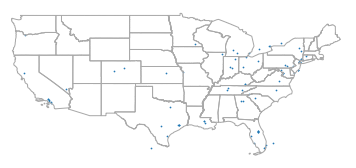

In [18]:
import struct
def by8(f):
    rec = 'x'  # placeholder for the `while`
    while rec:
        rec = f.read(8)
        if rec: 
            yield rec 

lng = []
lat = []
with open('H:\\testtweets_us','rb') as rf:
    count=0
    for rec in by8(rf):
        coor = struct.unpack('<ff', rec)
        lng.append(coor[0])
        lat.append(coor[1])
        count += 1
    print(count)
       
ax.scatter(lng,lat,s=0.5)
plt.show()

In [36]:
min([point[0] for point in US_state[2]['geometry']['coordinates'][0]])

-84.82030499999999

In [37]:
max([point[0] for point in US_state[2]['geometry']['coordinates'][0]])

-80.51845399999999

In [38]:
min([point[1] for point in US_state[2]['geometry']['coordinates'][0]])

38.403423

In [39]:
max([point[1] for point in US_state[2]['geometry']['coordinates'][0]])

42.327132

In [42]:
# extent [-84.82030499999999,38.403423]-[-80.51845399999999,42.327132]

## contiguous US shapefile

In [1]:
import matplotlib.pyplot as plt
import fiona

fname = '/Users/Yuxiao/cb_2016_us_nation_20m/cb_2016_us_nation_20m.shp'
US_contig = fiona.open(fname, 'r')

In [2]:
len(US_contig)

1

In [3]:
US_contig.schema

{'geometry': 'Polygon',
 'properties': OrderedDict([('AFFGEOID', 'str:9'),
              ('GEOID', 'str:2'),
              ('NAME', 'str:100')])}

In [4]:
US_contig.bounds

(-124.72583900000001,
 24.669463000000007,
 -66.94989499999997,
 49.38435800000002)

In [5]:
US_contig[0].keys()

dict_keys(['type', 'id', 'geometry', 'properties'])

In [6]:
US_contig[0]

{'geometry': {'coordinates': [[(-124.72583900000001, 48.38601200000011),
    (-124.65324299999986, 48.390691000000004),
    (-124.5462589999999, 48.3535940000001),
    (-124.38087399999995, 48.284699000000046),
    (-124.25088199999993, 48.26477299999999),
    (-124.10177299999992, 48.21688300000005),
    (-124.05073399999998, 48.17774700000007),
    (-123.880068, 48.16062100000005),
    (-123.72873599999997, 48.16280000000006),
    (-123.67244499999998, 48.162715000000105),
    (-123.551131, 48.15138200000001),
    (-123.44197199999991, 48.12425900000005),
    (-123.31457799999993, 48.11372499999999),
    (-123.23912899999999, 48.118217000000016),
    (-123.14478299999996, 48.17594300000002),
    (-123.06621000000001, 48.120469000000014),
    (-123.00412799999992, 48.09051600000004),
    (-122.94611899999995, 48.0985520000001),
    (-122.91068675572501, 48.10979974393274),
    (-122.83317299999999, 48.134406000000126),
    (-122.760448, 48.143240000000105),
    (-122.69846499999994, 4

In [8]:
len(US_contig[0]['geometry']['coordinates'][0])

2925

# county level data processing

In [192]:
import numpy as np
import pandas as pd
pd.__version__

'0.20.3'

In [193]:
# read unempployment
Unemployment = pd.read_excel('E://osu/research/county data/Unemployment.xls',header = 9, parse_cols="A:C,AT,AU",converters={'FIPStxt':str})

In [194]:
Unemployment.head()

,FIPStxt,State,Area_name,Unemployment_rate_2016,Median_Household_Income_2015
0,01000,AL,Alabama,6.0,44833.0
1,01001,AL,"Autauga County, AL",5.3,56580.0
2,01003,AL,"Baldwin County, AL",5.4,52387.0
3,01005,AL,"Barbour County, AL",8.6,31433.0
4,01007,AL,"Bibb County, AL",6.6,40767.0


In [195]:
Unemployment.shape

(3274, 5)

In [196]:
Unemployment= Unemployment.set_index(['FIPStxt'])

In [197]:
Unemployment.index.names = ['GEOID']

In [198]:
Unemployment.head()

,State,Area_name,Unemployment_rate_2016,Median_Household_Income_2015
GEOID,,,,
01000,AL,Alabama,6.0,44833.0
01001,AL,"Autauga County, AL",5.3,56580.0
01003,AL,"Baldwin County, AL",5.4,52387.0
01005,AL,"Barbour County, AL",8.6,31433.0
01007,AL,"Bibb County, AL",6.6,40767.0


In [199]:
# read population
Population = pd.read_excel('E://osu/research/county data/PopulationEstimates.xls',header = 2, parse_cols="A:C,Q",converters={'FIPS':str})

In [200]:
Population.head()

,FIPS,State,Area_Name,POP_ESTIMATE_2016
0,00000,US,United States,323127513
1,01000,AL,Alabama,4863300
2,01001,AL,Autauga County,55416
3,01003,AL,Baldwin County,208563
4,01005,AL,Barbour County,25965


In [201]:
Population.shape

(3273, 4)

In [202]:
Population= Population.set_index(['FIPS'])

In [203]:
Population.index.names = ['GEOID']

In [204]:
Population.head()

,State,Area_Name,POP_ESTIMATE_2016
GEOID,,,
00000,US,United States,323127513
01000,AL,Alabama,4863300
01001,AL,Autauga County,55416
01003,AL,Baldwin County,208563
01005,AL,Barbour County,25965


In [205]:
# read Poverty
Poverty = pd.read_excel('E://osu/research/county data/PovertyEstimates.xls',header = 3, parse_cols="A:C,K",converters={'FIPStxt':str})

In [206]:
Poverty.head()

,FIPStxt,State,Area_Name,PCTPOVALL_2015
0,00000,US,United States,14.7
1,01000,AL,Alabama,18.5
2,01001,AL,Autauga County,12.7
3,01003,AL,Baldwin County,12.9
4,01005,AL,Barbour County,32


In [207]:
Poverty.shape

(3194, 4)

In [208]:
Poverty = Poverty.set_index('FIPStxt')

In [209]:
Poverty.index.names = ['GEOID']

In [210]:
Poverty.head()

,State,Area_Name,PCTPOVALL_2015
GEOID,,,
00000,US,United States,14.7
01000,AL,Alabama,18.5
01001,AL,Autauga County,12.7
01003,AL,Baldwin County,12.9
01005,AL,Barbour County,32


In [211]:
# read education
Education = pd.read_excel('E://osu/research/county data/Education.xls',header = 4, parse_cols="A:C,AR,AU",converters={'FIPS Code':str})

In [212]:
Education = Education.set_index('FIPS Code')

In [213]:
Education.index.names = ['GEOID']

In [214]:
Education.head()

,State,Area name,"Percent of adults with less than a high school diploma, 2011-2015","Percent of adults with a bachelor's degree or higher, 2011-2015"
GEOID,,,,
00000,US,United States,13.3,29.8
01000,AL,Alabama,15.7,23.5
01001,AL,Autauga County,12.8,23.2
01003,AL,Baldwin County,10.5,29.0
01005,AL,Barbour County,26.7,12.5


In [215]:
Education.shape

(3283, 4)

In [216]:
# read age
age = pd.read_csv('E://osu/research/county data/age.csv')

In [217]:
age['STATE'] = age['STATE'].astype(str).str.zfill(2)
age['COUNTY'] = age['COUNTY'].astype(str).str.zfill(3)
age["GEOID"] = age["STATE"] + age["COUNTY"]

In [218]:
age = age.set_index('GEOID')

In [219]:
age.head()

,SUMLEV,STATE,COUNTY,STNAME,CTYNAME,PCT15_24,PCT25_34,PCT35_44
GEOID,,,,,,,,
01001,50,01,001,Alabama,Autauga County,12.956547,12.678649,13.312040
01003,50,01,003,Alabama,Baldwin County,11.301621,11.409023,12.089393
01005,50,01,005,Alabama,Barbour County,12.027730,14.226844,12.401309
01007,50,01,007,Alabama,Bibb County,11.906549,14.958265,13.522943
01009,50,01,009,Alabama,Blount County,12.016498,11.694163,12.439346


In [220]:
# read race and sex
race_sex = pd.read_csv('E://osu/research/county data/sexrace.csv')

In [221]:
race_sex['STATE'] = race_sex['STATE'].astype(str).str.zfill(2)
race_sex['COUNTY'] = race_sex['COUNTY'].astype(str).str.zfill(3)
race_sex["GEOID"] = race_sex["STATE"] + race_sex["COUNTY"]

In [222]:
race_sex = race_sex.set_index('GEOID')

In [223]:
race_sex.head()

,SUMLEV,STATE,COUNTY,STNAME,CTYNAME,TOT_POP,PCTMALE,PCTFEMALE,PCTWM,PCTWF,PCTBM,PCTBF,PCTHM,PCTHF
GEOID,,,,,,,,,,,,,,
01001,50,01,001,Alabama,Autauga County,55416,48.711563,51.288437,37.857298,39.320774,9.181464,10.099971,1.385881,1.302873
01003,50,01,003,Alabama,Baldwin County,208563,48.542167,51.457833,42.457195,44.727492,4.440864,4.757316,2.267420,2.148991
01005,50,01,005,Alabama,Barbour County,25965,53.067591,46.932409,26.366262,23.427691,25.414982,22.476411,2.287695,1.925669
01007,50,01,007,Alabama,Bibb County,22643,53.636886,46.363114,39.186504,37.366957,13.589189,8.192377,1.404408,1.095261
01009,50,01,009,Alabama,Blount County,57704,49.386524,50.613476,47.397061,48.549494,0.856093,0.755580,4.826355,4.242340


In [224]:
# county shapefile
import shapefile
county = shapefile.Reader('E://osu/research/cb_2016_us_county_20m/cb_2016_us_county_20m.shp')
fields = [x[0] for x in county.fields][1:]
records = county.records()
shps = [s.points for s in county.shapes()]
County = pd.DataFrame(columns=fields, data=records)
County = County.assign(coords=shps)

In [225]:
County.head()

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,coords
0,39,131,01074078,0500000US39131,39131,Pike,06,1140324458,9567612,"[(-83.35353099999999, 39.197585), (-82.7858909..."
1,46,003,01266983,0500000US46003,46003,Aurora,06,1834813753,11201379,"[(-98.807771, 43.935223), (-98.331508, 43.9377..."
2,55,035,01581077,0500000US55035,55035,Eau Claire,06,1652211310,18848512,"[(-91.650455, 44.855951), (-90.922247, 44.8573..."
3,48,259,01383915,0500000US48259,48259,Kendall,06,1715747531,1496797,"[(-98.920147, 30.138289999999998), (-98.587897..."
4,40,015,01101795,0500000US40015,40015,Caddo,06,3310745124,30820525,"[(-98.623149, 35.551597), (-98.313251, 35.5515..."


In [226]:
len(County)

3108

In [227]:
# read tweets
Tweets = pd.read_csv('E://osu/research/CountyTweets_f.csv',header=None, names = ['FID','Tweets'])

In [228]:
Tweets.head()

,FID,Tweets
0,0,660
1,1,60
2,2,8151
3,3,9787
4,4,3066


In [229]:
County = pd.concat([County, Tweets], axis=1)

In [230]:
County.head()

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,coords,FID,Tweets
0,39,131,01074078,0500000US39131,39131,Pike,06,1140324458,9567612,"[(-83.35353099999999, 39.197585), (-82.7858909...",0,660
1,46,003,01266983,0500000US46003,46003,Aurora,06,1834813753,11201379,"[(-98.807771, 43.935223), (-98.331508, 43.9377...",1,60
2,55,035,01581077,0500000US55035,55035,Eau Claire,06,1652211310,18848512,"[(-91.650455, 44.855951), (-90.922247, 44.8573...",2,8151
3,48,259,01383915,0500000US48259,48259,Kendall,06,1715747531,1496797,"[(-98.920147, 30.138289999999998), (-98.587897...",3,9787
4,40,015,01101795,0500000US40015,40015,Caddo,06,3310745124,30820525,"[(-98.623149, 35.551597), (-98.313251, 35.5515...",4,3066


In [231]:
County.shape

(3108, 12)

In [232]:
County_all= County.set_index(['GEOID'])

In [233]:
County_all.head()

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,NAME,LSAD,ALAND,AWATER,coords,FID,Tweets
GEOID,,,,,,,,,,,
39131,39,131,01074078,0500000US39131,Pike,06,1140324458,9567612,"[(-83.35353099999999, 39.197585), (-82.7858909...",0,660
46003,46,003,01266983,0500000US46003,Aurora,06,1834813753,11201379,"[(-98.807771, 43.935223), (-98.331508, 43.9377...",1,60
55035,55,035,01581077,0500000US55035,Eau Claire,06,1652211310,18848512,"[(-91.650455, 44.855951), (-90.922247, 44.8573...",2,8151
48259,48,259,01383915,0500000US48259,Kendall,06,1715747531,1496797,"[(-98.920147, 30.138289999999998), (-98.587897...",3,9787
40015,40,015,01101795,0500000US40015,Caddo,06,3310745124,30820525,"[(-98.623149, 35.551597), (-98.313251, 35.5515...",4,3066


In [234]:
County_all = pd.concat([County_all,Unemployment,Population,Poverty,Education], axis=1, join_axes=[County_all.index])

In [235]:
County_all

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,NAME,LSAD,ALAND,AWATER,coords,FID,...,State,Area_Name,POP_ESTIMATE_2016,State,Area_Name,PCTPOVALL_2015,State,Area name,"Percent of adults with less than a high school diploma, 2011-2015","Percent of adults with a bachelor's degree or higher, 2011-2015"
GEOID,,,,,,,,,,,,,,,,,,,,,
39131,39,131,01074078,0500000US39131,Pike,06,1140324458,9567612,"[(-83.35353099999999, 39.197585), (-82.7858909...",0,...,OH,Pike County,28160,OH,Pike County,21.4,OH,Pike County,22.2,11.8
46003,46,003,01266983,0500000US46003,Aurora,06,1834813753,11201379,"[(-98.807771, 43.935223), (-98.331508, 43.9377...",1,...,SD,Aurora County,2736,SD,Aurora County,9.6,SD,Aurora County,12.0,17.9
55035,55,035,01581077,0500000US55035,Eau Claire,06,1652211310,18848512,"[(-91.650455, 44.855951), (-90.922247, 44.8573...",2,...,WI,Eau Claire County,102965,WI,Eau Claire County,13.6,WI,Eau Claire County,6.8,31.1
48259,48,259,01383915,0500000US48259,Kendall,06,1715747531,1496797,"[(-98.920147, 30.138289999999998), (-98.587897...",3,...,TX,Kendall County,42540,TX,Kendall County,8,TX,Kendall County,9.2,40.8
40015,40,015,01101795,0500000US40015,Caddo,06,3310745124,30820525,"[(-98.623149, 35.551597), (-98.313251, 35.5515...",4,...,OK,Caddo County,29557,OK,Caddo County,21.3,OK,Caddo County,15.4,15.8
19093,19,093,00465235,0500000US19093,Ida,06,1117599859,1406461,"[(-95.74161099999999, 42.561285), (-95.38801, ...",5,...,IA,Ida County,6985,IA,Ida County,10.6,IA,Ida County,8.3,19.3
28071,28,071,00695759,0500000US28071,Lafayette,06,1636141755,123052156,"[(-89.721341, 34.554274), (-89.668448, 34.5543...",6,...,MS,Lafayette County,53796,MS,Lafayette County,21,MS,Lafayette County,10.8,38.3
12027,12,027,00294452,0500000US12027,DeSoto,06,1649978040,6247257,"[(-82.056497, 27.207769), (-82.055753, 27.3382...",7,...,FL,DeSoto County,35800,FL,DeSoto County,30.5,FL,DeSoto County,29.2,9.7
31137,31,137,00835890,0500000US31137,Phelps,06,1398048574,1646534,"[(-99.643462, 40.684911), (-99.444401, 40.6778...",8,...,NE,Phelps County,9266,NE,Phelps County,10.4,NE,Phelps County,7.3,22.7


In [236]:
County_all.shape

(3108, 25)

In [237]:
County_all = County_all.drop(County_all.columns[[0,1,2,3,5,6,7,8]], axis=1)

In [238]:
County_all= County_all.drop(County_all.columns[[3,7,10,13]], axis=1)

In [239]:
County_all= County_all.drop(County_all.columns[[0,6,8,10]], axis=1)

In [240]:
County_all

,FID,Tweets,Area_name,Unemployment_rate_2016,Median_Household_Income_2015,POP_ESTIMATE_2016,PCTPOVALL_2015,"Percent of adults with less than a high school diploma, 2011-2015","Percent of adults with a bachelor's degree or higher, 2011-2015"
GEOID,,,,,,,,,
39131,0,660,"Pike County, OH",7.4,39851.0,28160,21.4,22.2,11.8
46003,1,60,"Aurora County, SD",2.1,50392.0,2736,9.6,12.0,17.9
55035,2,8151,"Eau Claire County, WI",3.5,51937.0,102965,13.6,6.8,31.1
48259,3,9787,"Kendall County, TX",3.2,79108.0,42540,8,9.2,40.8
40015,4,3066,"Caddo County, OK",5.4,43548.0,29557,21.3,15.4,15.8
19093,5,284,"Ida County, IA",2.6,53804.0,6985,10.6,8.3,19.3
28071,6,9358,"Lafayette County, MS",4.8,43435.0,53796,21,10.8,38.3
12027,7,983,"DeSoto County, FL",5.2,34380.0,35800,30.5,29.2,9.7
31137,8,580,"Phelps County, NE",2.6,55566.0,9266,10.4,7.3,22.7


In [241]:
new_columns = County_all.columns.values
new_columns[3] = 'UEP16'
new_columns[4] = 'MHI15'
new_columns[5] = 'POP16'
new_columns[6] = 'PCTPOV15'
new_columns[7] = 'PCTHSD15'
new_columns[8] = 'PCTBD15'
County_all.columns = new_columns

In [242]:
County_all.head()

,FID,Tweets,Area_name,UEP16,MHI15,POP16,PCTPOV15,PCTHSD15,PCTBD15
GEOID,,,,,,,,,
39131,0,660,"Pike County, OH",7.4,39851.0,28160,21.4,22.2,11.8
46003,1,60,"Aurora County, SD",2.1,50392.0,2736,9.6,12.0,17.9
55035,2,8151,"Eau Claire County, WI",3.5,51937.0,102965,13.6,6.8,31.1
48259,3,9787,"Kendall County, TX",3.2,79108.0,42540,8,9.2,40.8
40015,4,3066,"Caddo County, OK",5.4,43548.0,29557,21.3,15.4,15.8


In [243]:
County_all = pd.concat([County_all,age,race_sex], axis=1, join_axes=[County_all.index])

In [244]:
County_all.head()

,FID,Tweets,Area_name,UEP16,MHI15,POP16,PCTPOV15,PCTHSD15,PCTBD15,SUMLEV,...,CTYNAME,TOT_POP,PCTMALE,PCTFEMALE,PCTWM,PCTWF,PCTBM,PCTBF,PCTHM,PCTHF
GEOID,,,,,,,,,,,,,,,,,,,,,
39131,0,660,"Pike County, OH",7.4,39851.0,28160,21.4,22.2,11.8,50,...,Pike County,28160,49.946733,50.053267,47.780540,48.178267,0.600142,0.468750,0.493608,0.486506
46003,1,60,"Aurora County, SD",2.1,50392.0,2736,9.6,12.0,17.9,50,...,Aurora County,2736,52.302632,47.697368,49.415205,45.394737,0.438596,0.402047,3.289474,1.937135
55035,2,8151,"Eau Claire County, WI",3.5,51937.0,102965,13.6,6.8,31.1,50,...,Eau Claire County,102965,49.295392,50.704608,45.317341,47.015976,0.641966,0.426358,1.246054,1.078036
48259,3,9787,"Kendall County, TX",3.2,79108.0,42540,8,9.2,40.8,50,...,Kendall County,42540,48.747062,51.252938,46.377527,48.899859,0.674659,0.538317,11.685473,11.647861
40015,4,3066,"Caddo County, OK",5.4,43548.0,29557,21.3,15.4,15.8,50,...,Caddo County,29557,52.383530,47.616470,34.086680,30.158676,2.178841,0.730791,7.186115,4.983591


In [245]:
County_all= County_all.drop(County_all.columns[[9,10,11,12,17,18,19,20]], axis=1)

In [246]:
County_all.head()

,FID,Tweets,Area_name,UEP16,MHI15,POP16,PCTPOV15,PCTHSD15,PCTBD15,CTYNAME,...,CTYNAME,TOT_POP,PCTMALE,PCTFEMALE,PCTWM,PCTWF,PCTBM,PCTBF,PCTHM,PCTHF
GEOID,,,,,,,,,,,,,,,,,,,,,
39131,0,660,"Pike County, OH",7.4,39851.0,28160,21.4,22.2,11.8,Pike County,...,Pike County,28160,49.946733,50.053267,47.780540,48.178267,0.600142,0.468750,0.493608,0.486506
46003,1,60,"Aurora County, SD",2.1,50392.0,2736,9.6,12.0,17.9,Aurora County,...,Aurora County,2736,52.302632,47.697368,49.415205,45.394737,0.438596,0.402047,3.289474,1.937135
55035,2,8151,"Eau Claire County, WI",3.5,51937.0,102965,13.6,6.8,31.1,Eau Claire County,...,Eau Claire County,102965,49.295392,50.704608,45.317341,47.015976,0.641966,0.426358,1.246054,1.078036
48259,3,9787,"Kendall County, TX",3.2,79108.0,42540,8,9.2,40.8,Kendall County,...,Kendall County,42540,48.747062,51.252938,46.377527,48.899859,0.674659,0.538317,11.685473,11.647861
40015,4,3066,"Caddo County, OK",5.4,43548.0,29557,21.3,15.4,15.8,Caddo County,...,Caddo County,29557,52.383530,47.616470,34.086680,30.158676,2.178841,0.730791,7.186115,4.983591


In [247]:
County_all= County_all.drop(County_all.columns[[9,13,14]], axis=1)

In [248]:
County_all

,FID,Tweets,Area_name,UEP16,MHI15,POP16,PCTPOV15,PCTHSD15,PCTBD15,PCT15_24,PCT25_34,PCT35_44,PCTMALE,PCTFEMALE,PCTWM,PCTWF,PCTBM,PCTBF,PCTHM,PCTHF
GEOID,,,,,,,,,,,,,,,,,,,,
39131,0,660,"Pike County, OH",7.4,39851.0,28160,21.4,22.2,11.8,11.921165,11.622869,12.336648,49.946733,50.053267,47.780540,48.178267,0.600142,0.468750,0.493608,0.486506
46003,1,60,"Aurora County, SD",2.1,50392.0,2736,9.6,12.0,17.9,12.061404,10.307018,10.307018,52.302632,47.697368,49.415205,45.394737,0.438596,0.402047,3.289474,1.937135
55035,2,8151,"Eau Claire County, WI",3.5,51937.0,102965,13.6,6.8,31.1,20.099063,13.738649,10.943524,49.295392,50.704608,45.317341,47.015976,0.641966,0.426358,1.246054,1.078036
48259,3,9787,"Kendall County, TX",3.2,79108.0,42540,8,9.2,40.8,12.661025,9.367654,11.889986,48.747062,51.252938,46.377527,48.899859,0.674659,0.538317,11.685473,11.647861
40015,4,3066,"Caddo County, OK",5.4,43548.0,29557,21.3,15.4,15.8,12.626451,13.499340,11.584396,52.383530,47.616470,34.086680,30.158676,2.178841,0.730791,7.186115,4.983591
19093,5,284,"Ida County, IA",2.6,53804.0,6985,10.6,8.3,19.3,11.023622,10.336435,10.207588,50.064424,49.935576,49.019327,48.847530,0.214746,0.171797,1.317108,1.130995
28071,6,9358,"Lafayette County, MS",4.8,43435.0,53796,21,10.8,38.3,26.920217,14.469477,11.192282,48.693211,51.306789,35.762882,36.681166,10.926463,12.895011,1.267752,1.178526
12027,7,983,"DeSoto County, FL",5.2,34380.0,35800,30.5,29.2,9.7,12.731844,13.787710,12.002793,56.743017,43.256983,46.692737,36.974860,8.139665,4.776536,20.097765,10.994413
31137,8,580,"Phelps County, NE",2.6,55566.0,9266,10.4,7.3,22.7,12.594431,10.878480,10.479171,50.053961,49.946039,48.791280,48.650982,0.194259,0.215843,2.946255,2.654867


In [249]:
County_all.shape

(3108, 20)

In [250]:
County_all.isnull().sum()

FID          0
Tweets       0
Area_name    0
UEP16        0
MHI15        0
POP16        0
PCTPOV15     0
PCTHSD15     0
PCTBD15      0
PCT15_24     0
PCT25_34     0
PCT35_44     0
PCTMALE      0
PCTFEMALE    0
PCTWM        0
PCTWF        0
PCTBM        0
PCTBF        0
PCTHM        0
PCTHF        0
dtype: int64

In [1]:
import fiona
shp1 = fiona.open("/Users/Yuxiao/cb_2016_us_county_20m/cb_2016_us_county_20m.shp", 'r')
from shapely.geometry import MultiPoint, Polygon, MultiPolygon, shape
shps = [shape(pol['geometry']) for pol in shp1]
centroids = [shp.centroid.coords[0] for shp in shps]

In [252]:
centroids

[(-83.06769584018872, 39.07634000872211),
 (-98.5605057741495, 43.717576159922764),
 (-91.28609183386752, 44.726614001638595),
 (-98.71135955694437, 29.945661436823034),
 (-98.37534463834308, 35.17364557445208),
 (-95.51355387095936, 42.386961363331274),
 (-89.4849096100213, 34.35687874421591),
 (-81.80941373380176, 27.1867789302738),
 (-99.41465112614063, 40.51151142277798),
 (-84.61067651312344, 44.33473082084372),
 (-116.76476945275367, 44.00545243313907),
 (-81.99225983741944, 34.92960077109205),
 (-78.67918555993064, 42.247841111566544),
 (-86.87924771893162, 38.36593080151621),
 (-94.67824620957559, 43.081938487861535),
 (-95.740062765968, 37.88653359982741),
 (-85.00493569483731, 42.24633833784932),
 (-98.94877182306017, 40.506633140288386),
 (-98.99180433768247, 35.29071823585757),
 (-97.1882959341076, 44.67385953766033),
 (-100.52975334249707, 31.88911732690479),
 (-101.71976237693119, 39.35147699380288),
 (-93.99222144004727, 40.355700880118846),
 (-94.75463785042564, 35.4944

In [253]:
County_all['x']=pd.Series([p[0] for p in centroids], index=County_all.index)
County_all['y']=pd.Series([p[1] for p in centroids], index=County_all.index)

In [258]:
County_all=County_all.drop(County_all.columns[2], axis=1)
County_all.head()

,FID,Tweets,UEP16,MHI15,POP16,PCTPOV15,PCTHSD15,PCTBD15,PCT15_24,PCT25_34,...,PCTMALE,PCTFEMALE,PCTWM,PCTWF,PCTBM,PCTBF,PCTHM,PCTHF,x,y
GEOID,,,,,,,,,,,,,,,,,,,,,
39131,0,660,7.4,39851.0,28160,21.4,22.2,11.8,11.921165,11.622869,...,49.946733,50.053267,47.780540,48.178267,0.600142,0.468750,0.493608,0.486506,-83.067696,39.076340
46003,1,60,2.1,50392.0,2736,9.6,12.0,17.9,12.061404,10.307018,...,52.302632,47.697368,49.415205,45.394737,0.438596,0.402047,3.289474,1.937135,-98.560506,43.717576
55035,2,8151,3.5,51937.0,102965,13.6,6.8,31.1,20.099063,13.738649,...,49.295392,50.704608,45.317341,47.015976,0.641966,0.426358,1.246054,1.078036,-91.286092,44.726614
48259,3,9787,3.2,79108.0,42540,8,9.2,40.8,12.661025,9.367654,...,48.747062,51.252938,46.377527,48.899859,0.674659,0.538317,11.685473,11.647861,-98.711360,29.945661
40015,4,3066,5.4,43548.0,29557,21.3,15.4,15.8,12.626451,13.499340,...,52.383530,47.616470,34.086680,30.158676,2.178841,0.730791,7.186115,4.983591,-98.375345,35.173646


In [259]:
County_all.to_csv("E://osu//research//County_all.csv", sep=',')

## GWR

In [1]:
import numpy as np
import pandas as pd
import geopandas as gp
import pysal as ps
import matplotlib
import matplotlib.pyplot as plt
%pylab inline
from gwr.sel_bw import Sel_BW
from gwr.gwr import GWR
from pysal.contrib.glm.family import Gaussian

Populating the interactive namespace from numpy and matplotlib


In [2]:
# prep data
data = ps.open('E://osu/research/County_all.csv')
coords = list(zip(data.by_col('x'), data.by_col('y')))
y = np.array(data.by_col('Tweets')).reshape((-1,1))
y = (y - np.mean(y)) / np.std(y)
UEP16 = np.array(data.by_col('UEP16')).reshape((-1,1))
UEP16 = (UEP16 - np.mean(UEP16)) / np.std(UEP16)
MHI15 = np.array(data.by_col('MHI15')).reshape((-1,1))
MHI15 = (MHI15 - np.mean(MHI15)) / np.std(MHI15)
POP16 = np.array(data.by_col('POP16')).reshape((-1,1))
POP16 = (POP16 - np.mean(POP16)) / np.std(POP16)
PCTPOV15 = np.array(data.by_col('PCTPOV15')).reshape((-1,1))
PCTPOV15 = (PCTPOV15 - np.mean(PCTPOV15)) / np.std(PCTPOV15)
PCTHSD15 = np.array(data.by_col('PCTHSD15')).reshape((-1,1))
PCTHSD15 = (PCTHSD15 - np.mean(PCTHSD15)) / np.std(PCTHSD15)
PCTBD15 = np.array(data.by_col('PCTBD15')).reshape((-1,1))
PCTBD15 = (PCTBD15 - np.mean(PCTBD15)) / np.std(PCTBD15)
PCT15_24 = np.array(data.by_col('PCT15_24')).reshape((-1,1))
PCT15_24 = (PCT15_24 - np.mean(PCT15_24)) / np.std(PCT15_24)
PCT25_34 = np.array(data.by_col('PCT25_34')).reshape((-1,1))
PCT25_34 = (PCT25_34 - np.mean(PCT25_34)) / np.std(PCT25_34)
PCT35_44 = np.array(data.by_col('PCT35_44')).reshape((-1,1))
PCT35_44 = (PCT35_44 - np.mean(PCT35_44)) / np.std(PCT35_44)
PCTMALE = np.array(data.by_col('PCTMALE')).reshape((-1,1))
PCTMALE = (PCTMALE - np.mean(PCTMALE)) / np.std(PCTMALE)
PCTFEMALE = np.array(data.by_col('PCTFEMALE')).reshape((-1,1))
PCTFEMALE = (PCTFEMALE - np.mean(PCTFEMALE)) / np.std(PCTFEMALE)
PCTWM = np.array(data.by_col('PCTWM')).reshape((-1,1))
PCTWM = (PCTWM  - np.mean(PCTWM)) / np.std(PCTWM)
PCTWF = np.array(data.by_col('PCTWF')).reshape((-1,1))
PCTWF = (PCTWF  - np.mean(PCTWF)) / np.std(PCTWF)
PCTBM = np.array(data.by_col('PCTBM')).reshape((-1,1))
PCTBM = (PCTBM - np.mean(PCTBM)) / np.std(PCTBM)
PCTBF = np.array(data.by_col('PCTBF')).reshape((-1,1))
PCTBF = (PCTBF - np.mean(PCTBF)) / np.std(PCTBF)
PCTHM = np.array(data.by_col('PCTHM')).reshape((-1,1))
PCTHM = (PCTHM - np.mean(PCTHM)) / np.std(PCTHM)
PCTHF = np.array(data.by_col('PCTHF')).reshape((-1,1))
PCTHF = (PCTHF - np.mean(PCTHF)) / np.std(PCTHF)

#X = np.hstack([UEP16, MHI15, POP16, PCTPOV15, PCTHSD15, PCTBD15, PCT15_24, PCT25_34, PCT35_44, PCTMALE, PCTFEMALE, PCTWM, PCTWF, PCTBM, PCTHM, PCTHM,PCTHF])
X = np.hstack([POP16, PCTPOV15,PCTBD15, PCT15_24,PCT25_34,PCT35_44, PCTWM])
labels = ['Intercept', 'Population','Poverty','Bachelor degree',
          'age:15-24','age:25-34','age:35-44','White Male']


In [3]:
X

array([[ -2.26542071e-01,   7.89017915e-01,  -9.52344356e-01, ...,
         -9.14513437e-02,   6.33118422e-01,   6.43971818e-01],
       [ -3.03226349e-01,  -1.03784379e+00,  -2.75976333e-01, ...,
         -7.07989515e-01,  -7.96800747e-01,   8.48341689e-01],
       [ -9.14027985e-04,  -4.18568634e-01,   1.18763972e+00, ...,
          8.99890532e-01,  -3.48367575e-01,   3.36016563e-01],
       ..., 
       [  5.41769600e-01,  -2.94713603e-01,   1.39831172e+00, ...,
         -1.46372116e-01,  -5.59013686e-01,   2.54924287e-01],
       [  1.56510307e-02,   4.94862217e-01,  -5.19912342e-01, ...,
         -4.09332124e-01,  -8.55056969e-01,   3.95056526e-01],
       [  8.83207245e-02,  -1.73452833e+00,   7.66295701e-01, ...,
          9.25236615e-03,   1.89162354e+00,   6.85274469e-01]])

In [4]:
xdf =  pd.DataFrame(X,columns =['Population','Poverty','Bachelor degree',
          'age:15-24','age:25-34','age:35-44','White Male'])

In [5]:
xdf.head()

,Population,Poverty,Bachelor degree,age:15-24,age:25-34,age:35-44,White Male
0,-0.226542,0.789018,-0.952344,-0.254073,-0.091451,0.633118,0.643972
1,-0.303226,-1.037844,-0.275976,-0.211304,-0.707990,-0.796801,0.848342
2,-0.000914,-0.418569,1.187640,2.239934,0.899891,-0.348368,0.336017
3,-0.183169,-1.285554,2.263176,-0.028438,-1.148125,0.318435,0.468564
4,-0.222328,0.773536,-0.508824,-0.038982,0.787763,0.103141,-1.068069


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000000000AA408D0>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x000000000C854358>]], dtype=object)

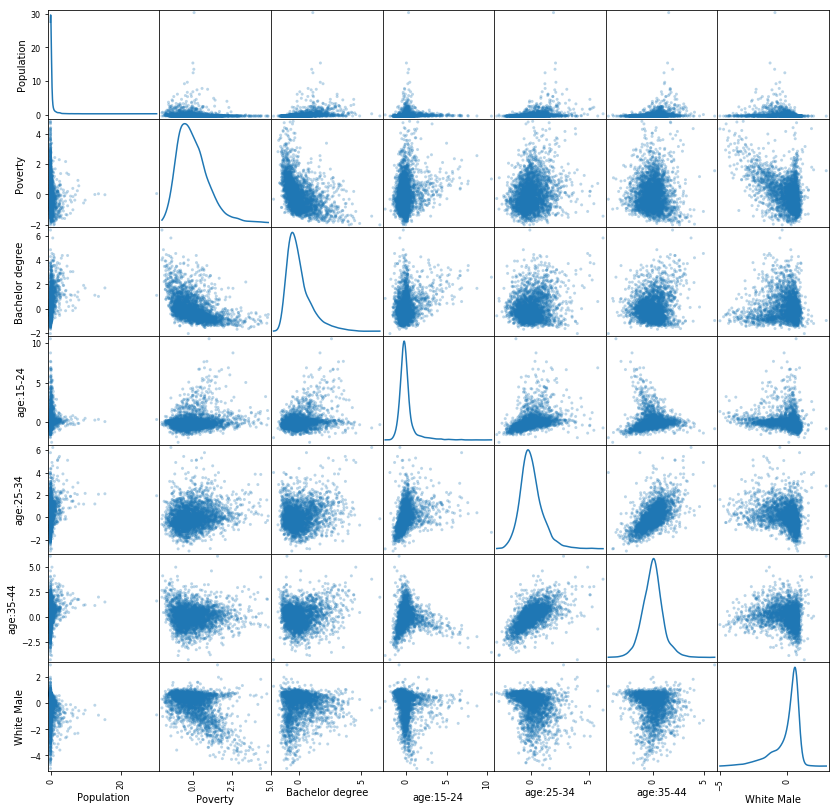

In [6]:
pd.plotting.scatter_matrix(xdf, alpha = 0.3, figsize = (14,14), diagonal = 'kde')

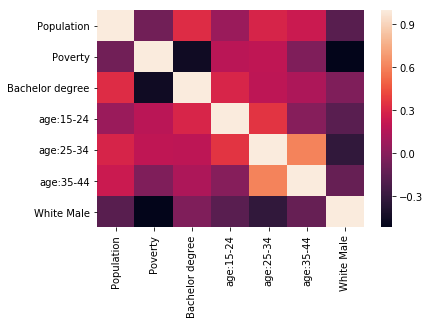

In [9]:
import seaborn as sns
corr = xdf.corr()
sns.heatmap(corr,xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)

In [29]:
corr

,Population,Poverty,Bachelor degree,age:15-24,age:25-34,age:35-44,White Male
Population,1.000000,-0.074038,0.325624,0.067878,0.291834,0.238598,-0.171668
Poverty,-0.074038,1.000000,-0.457160,0.179602,0.194932,-0.025823,-0.516502
Bachelor degree,0.325624,-0.457160,1.000000,0.296078,0.190071,0.132033,-0.024864
age:15-24,0.067878,0.179602,0.296078,1.000000,0.356110,-0.001216,-0.163436
age:25-34,0.291834,0.194932,0.190071,0.356110,1.000000,0.603154,-0.318726
age:35-44,0.238598,-0.025823,0.132033,-0.001216,0.603154,1.000000,-0.116762
White Male,-0.171668,-0.516502,-0.024864,-0.163436,-0.318726,-0.116762,1.000000


In [10]:
# multiple regresssion and vif
from patsy import dmatrices
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

#df = pd.read_csv('E://osu/research/County_all.csv')
df =  pd.DataFrame(X,columns =[ 'Population','Poverty','Bachelor_degree',
          'age_15_24','age_25_34','age_35_44','White_Male'])
df["Tweets"]= pd.DataFrame(y)
df.shape
df.columns

d:\program files\python\python36\lib\site-packages\statsmodels\compat\pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


Index(['Population', 'Poverty', 'Bachelor_degree', 'age_15_24', 'age_25_34',
       'age_35_44', 'White_Male', 'Tweets'],
      dtype='object')

In [11]:
# Break into left and right hand side; y and X

y1, X1 = dmatrices('Tweets ~'+df.columns[0]+ '+' +df.columns[1] +'+'+df.columns[2]+'+'+df.columns[3]+'+'+df.columns[4]+'+'+df.columns[5]+'+'+df.columns[6] , data=df, return_type="dataframe")

# For each Xi, calculate VIF
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X1.values, i) for i in range(X1.shape[1])]
vif["features"] = X1.columns
# Fit X to y
result = sm.OLS(y1, X1).fit()

In [12]:
vif.round(1)

,VIF Factor,features
0,1.0,Intercept
1,1.2,Population
2,2.3,Poverty
3,1.9,Bachelor_degree
4,1.5,age_15_24
5,2.2,age_25_34
6,1.8,age_35_44
7,1.6,White_Male


In [13]:
result.params

Intercept         -1.615461e-17
Population         9.058327e-01
Poverty            5.092848e-02
Bachelor_degree    2.196890e-02
age_15_24         -6.216517e-02
age_25_34          7.948808e-02
age_35_44         -5.523013e-02
White_Male         2.972961e-02
dtype: float64

In [14]:
result.pvalues

Intercept          1.000000e+00
Population         0.000000e+00
Poverty            3.814149e-06
Bachelor_degree    3.003633e-02
age_15_24          3.593276e-12
age_25_34          3.611591e-13
age_35_44          1.570614e-08
White_Male         1.517715e-03
dtype: float64

In [43]:
result.ssr

518.17984514233785

In [46]:
result.llf

-1626.2061878073837

In [15]:
result.rsquared

0.8332754681009209

In [31]:
result.aic

3268.4123756147674

In [85]:
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:                 Tweets   R-squared:                       0.833
Model:                            OLS   Adj. R-squared:                  0.833
Method:                 Least Squares   F-statistic:                     2213.
Date:                Fri, 01 Dec 2017   Prob (F-statistic):               0.00
Time:                        01:31:10   Log-Likelihood:                -1626.2
No. Observations:                3108   AIC:                             3268.
Df Residuals:                    3100   BIC:                             3317.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
Intercept       -1.615e-17      0.007   -2

0 2462153


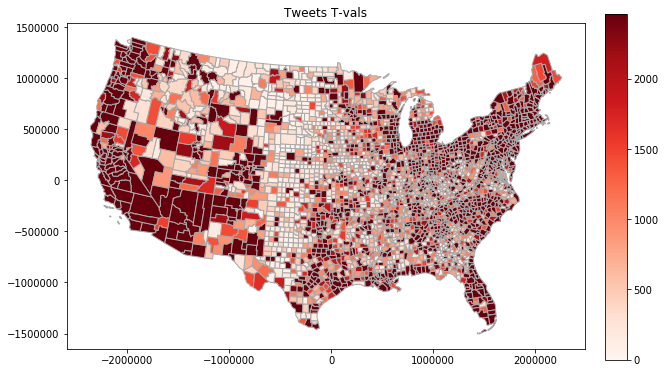

In [17]:
#Data
shp = gp.read_file('/Users/Yuxiao/cb_2016_us_county_20m/cb_2016_us_county_20m.shp')
shp2 = shp.to_crs("+proj=lcc +lat_1=33 +lat_2=45 +lat_0=39 +lon_0=-96 +x_0=0 +y_0=0 +ellps=GRS80 +datum=NAD83 +units=m +no_defs")
vmin, vmax = np.min(shp2['Tweet']), np.max(shp2['Tweet']) 
print(vmin,vmax)
ax = shp2.plot('Tweet', vmin=vmin, vmax=vmax/1000, figsize=(10,6), cmap='Reds', edgecolor = 'darkgrey')
ax.set_title('Tweets' + ' T-vals')
fig = ax.get_figure()
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=vmin, vmax=vmax/1000), cmap='Reds')
sm._A = []
fig.colorbar(sm, cax=cax)

0 2462153


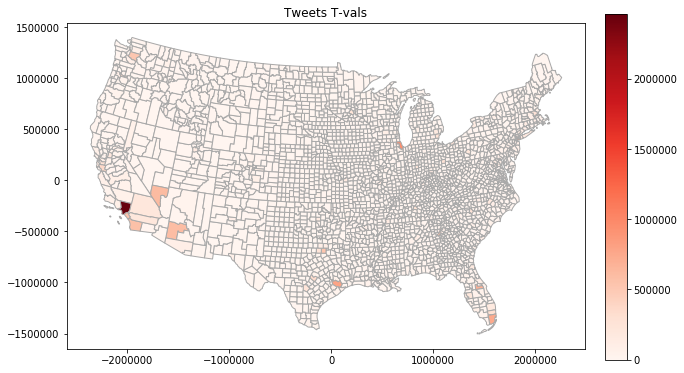

In [18]:
#Data
shp = gp.read_file('/Users/Yuxiao/cb_2016_us_county_20m/cb_2016_us_county_20m.shp')
shp2 = shp.to_crs("+proj=lcc +lat_1=33 +lat_2=45 +lat_0=39 +lon_0=-96 +x_0=0 +y_0=0 +ellps=GRS80 +datum=NAD83 +units=m +no_defs")
vmin, vmax = np.min(shp2['Tweet']), np.max(shp2['Tweet']) 
print(vmin,vmax)
ax = shp2.plot('Tweet', vmin=vmin, vmax=vmax, figsize=(10,6), cmap='Reds', edgecolor = 'darkgrey')
ax.set_title('Tweets' + ' T-vals')
fig = ax.get_figure()
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=vmin, vmax=vmax), cmap='Reds')
sm._A = []
fig.colorbar(sm, cax=cax)

LA! Twitter rockstar!

13926.0801158 72767.8369729


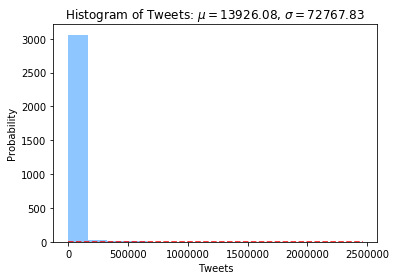

In [19]:
import matplotlib.mlab as mlab
n, bins, patches = plt.hist(shp2['Tweet'], 15, facecolor='dodgerblue', alpha=0.5)
mu =  np.mean(shp2['Tweet'])
sigma = np.std(shp2['Tweet'])
print(mu, sigma)
# add a 'best fit' line
yfit = mlab.normpdf(bins, mu, sigma)
plt.plot(bins, yfit, 'r--')
plt.xlabel('Tweets')
plt.ylabel('Probability')
plt.title(r'Histogram of Tweets: $\mu=13926.08$, $\sigma=72767.83$')
 
# Tweak spacing to prevent clipping of ylabel
plt.subplots_adjust(left=0.15)
plt.show()

In [20]:
shp2["poverty"]=gp.GeoDataFrame(np.array(data.by_col('PCTPOV15')).reshape((-1,1)))

3.4 47.4


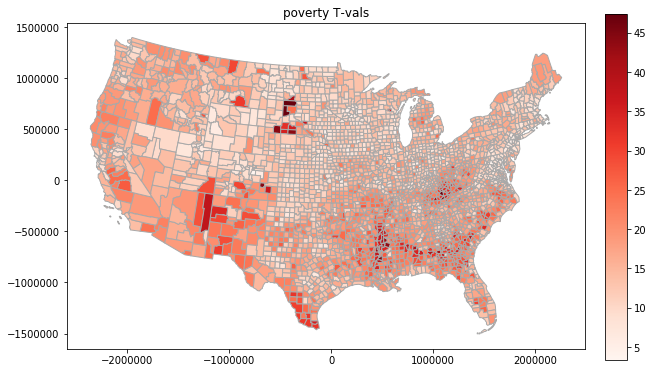

In [121]:
vmin, vmax = np.min(shp2["poverty"]), np.max(shp2["poverty"]) 
print(vmin,vmax)
ax = shp2.plot("poverty", vmin=vmin, vmax=vmax, figsize=(10,6), cmap='Reds', edgecolor = 'darkgrey')
ax.set_title('poverty' + ' T-vals')
fig = ax.get_figure()
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=vmin, vmax=vmax), cmap='Reds')
sm._A = []
fig.colorbar(sm, cax=cax)

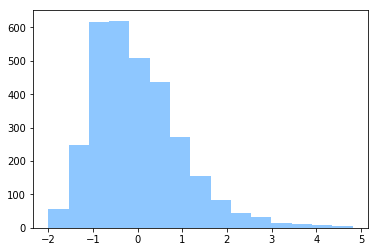

In [114]:
n, bins, patches = plt.hist(df['Poverty'], 15, facecolor='dodgerblue', alpha=0.5)

In [22]:
#Coordinates for calibration points
u = [row.geometry.centroid.x for index, row in shp2.iterrows()]
v = [row.geometry.centroid.y for index, row in shp2.iterrows()]
coords = list(zip(u,v))

In [23]:
#Find optimal bandwidth using golden section search to minimize AICc

#Instantiate bandwidth selection class - bisquare NN (adaptive)
bw = Sel_BW(coords, y, X, kernel='bisquare', fixed=False)

#Find optimal bandwidth by minimizing AICc using golden section search algorithm
bw = bw.search(search='golden_section', criterion='AICc')
print(bw)

159.0


In [24]:
#Instantiate GWR model and then estimate parameters and diagnostics using fit method
model = GWR(coords, y, X, bw, family=Gaussian(), fixed=False, kernel='bisquare')
results = model.fit()

In [25]:
shape(results.params)

(3108, 8)

In [26]:
paramsdf = pd.DataFrame(results.params, columns = ['Intercept', 'Population','Povety','Bachelor degree','age:15-24','age:25-34','age:35-44','White Male'])

In [27]:
paramsdf.head()

,Intercept,Population,Povety,Bachelor degree,age:15-24,age:25-34,age:35-44,White Male
0,-0.083868,0.985220,0.013112,-0.033592,0.018674,0.023558,0.012237,0.138696
1,-0.056961,0.464565,0.004129,-0.000299,-0.000357,-0.003261,-0.002549,0.002036
2,-0.018502,0.881095,0.034667,-0.036304,-0.001030,-0.014191,-0.030649,0.043775
3,0.006111,0.717104,0.057649,0.141193,-0.112805,0.117524,-0.047174,0.015317
4,0.011405,0.760736,0.024923,-0.004723,-0.017113,0.004704,-0.029310,0.022840


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000000037445F60>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x000000001833CC18>]], dtype=object)

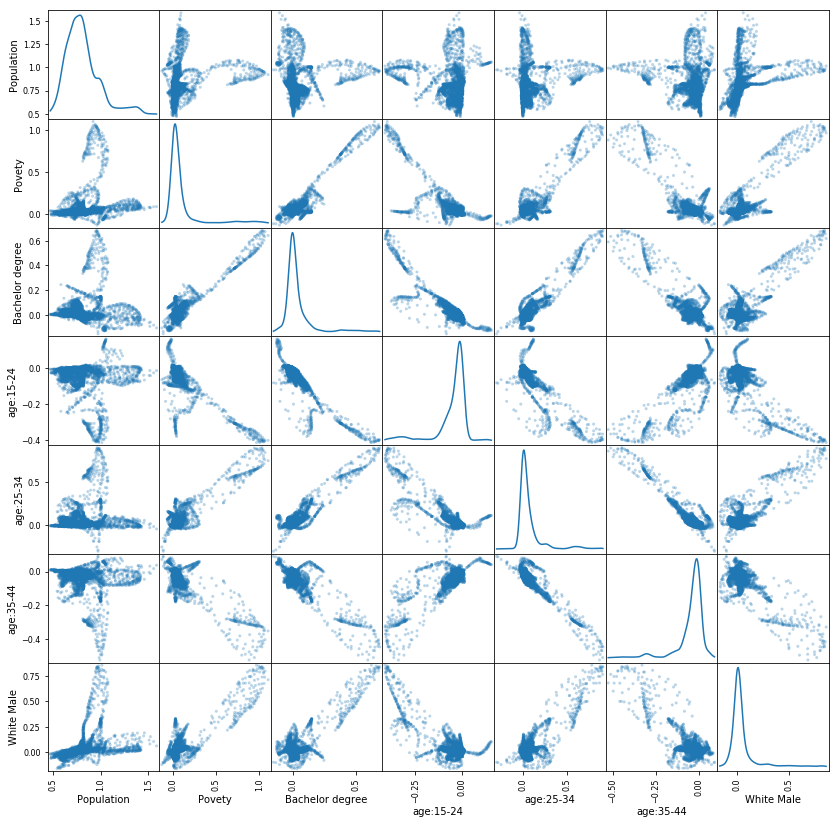

In [379]:
pd.plotting.scatter_matrix(paramsdf, alpha = 0.3, figsize = (14,14), diagonal = 'kde')

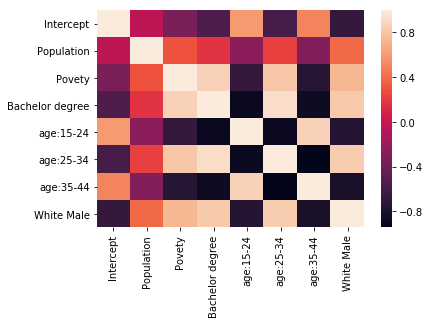

In [359]:
import seaborn as sns
corr = paramsdf.corr()
sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)

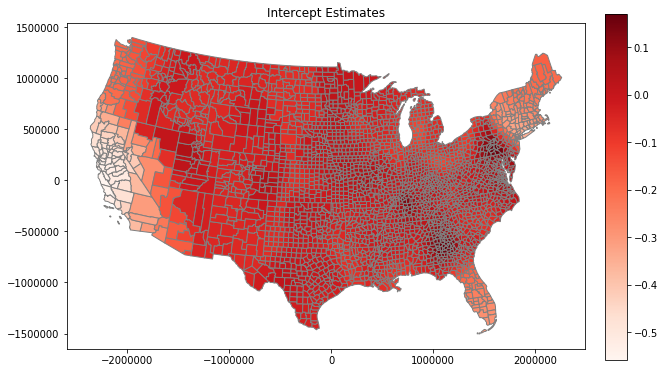

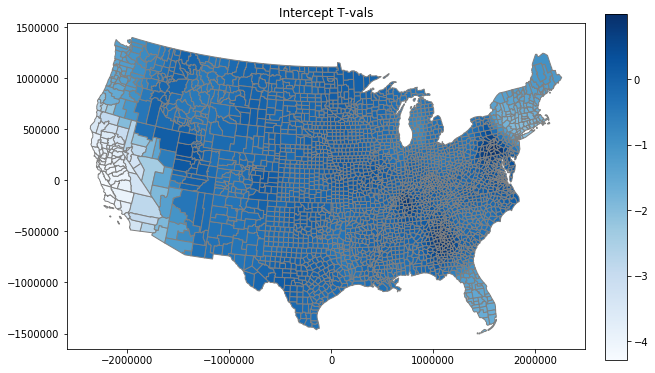

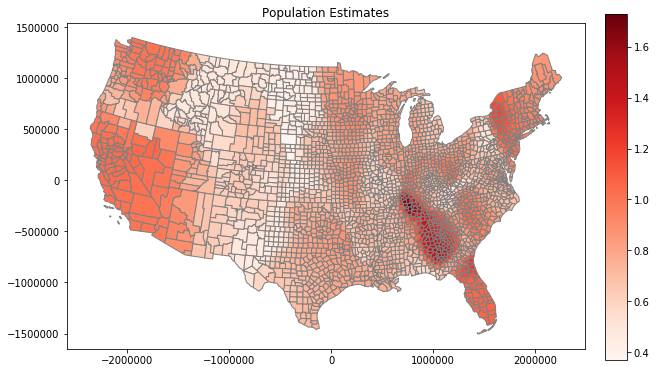

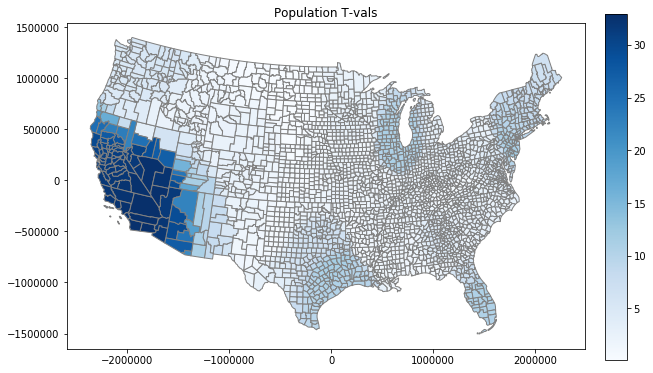

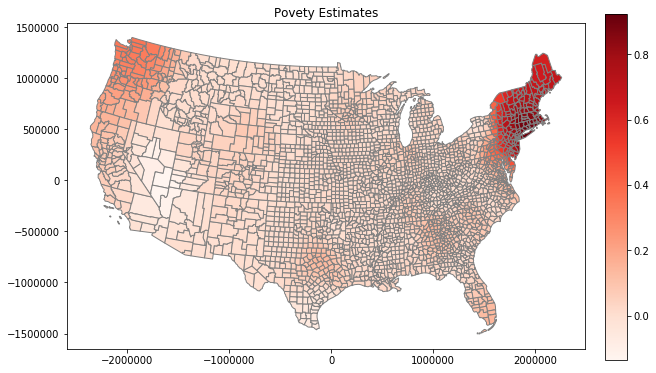

...

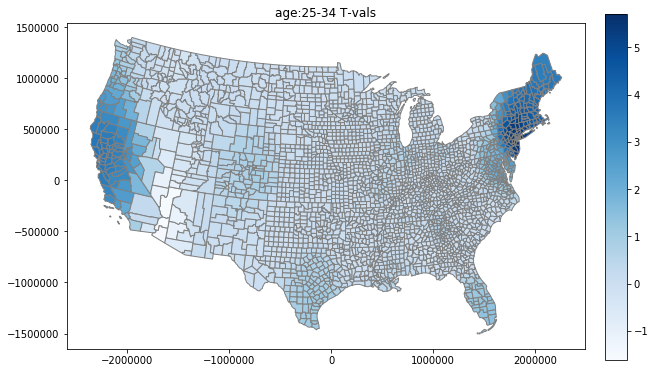

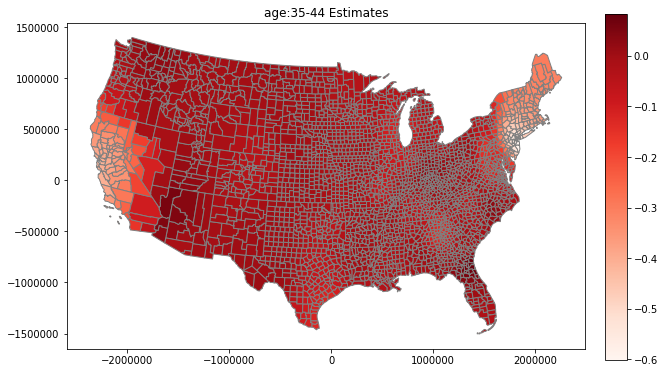

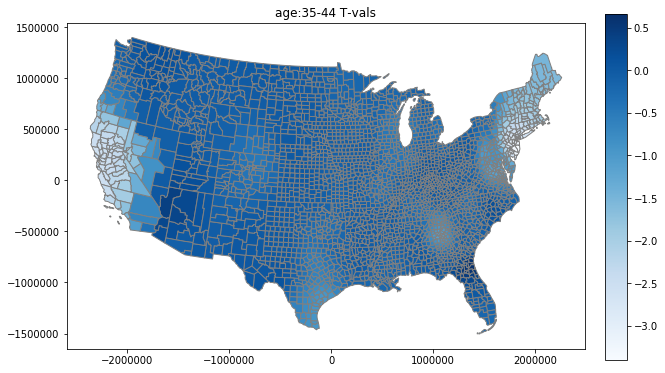

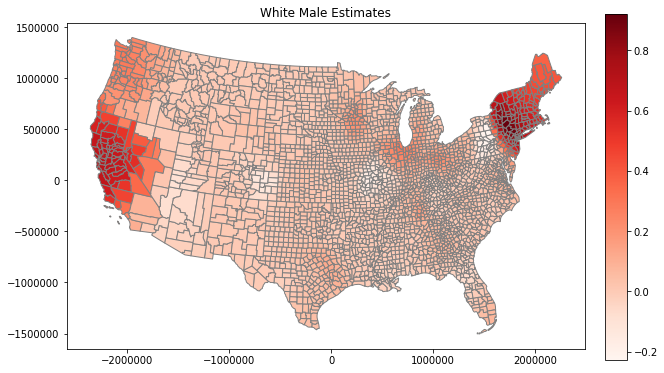

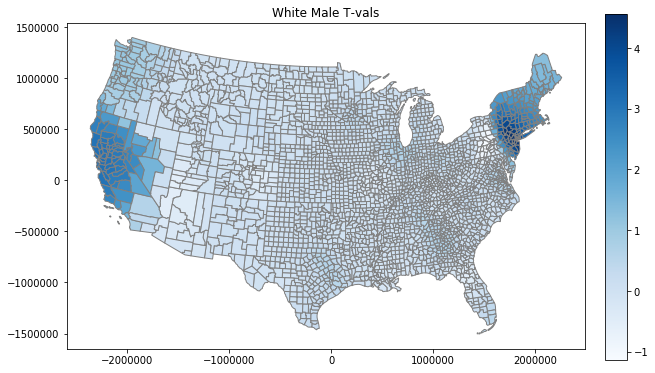

In [383]:
for param in range(results.params.shape[1]):
    shp2[str(param)] = results.params[:,param]
    vmin, vmax = np.min(shp2[str(param)]), np.max(shp2[str(param)]) 
    ax = shp2.plot(str(param), vmin=vmin, vmax=vmax, figsize=(10,6), cmap='Reds', edgecolor = 'grey')
    ax.set_title(labels[param] + ' Estimates')
    fig = ax.get_figure()
    cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
    sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=vmin, vmax=vmax), cmap='Reds')
    sm._A = []
    fig.colorbar(sm, cax=cax)
    
    shp2[str(param)] = results.tvalues[:,param]
    vmin, vmax = np.min(shp2[str(param)]), np.max(shp2[str(param)]) 
    ax = shp2.plot(str(param), vmin=vmin, vmax=vmax, figsize=(10,6), cmap='Blues', edgecolor = 'grey')
    ax.set_title(labels[param] + ' T-vals')
    fig = ax.get_figure()
    cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
    sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=vmin, vmax=vmax), cmap='Blues')
    sm._A = []
    fig.colorbar(sm, cax=cax)

In [38]:
results.llf

-771.97416674934357

In [56]:
aic = -2.0 * results.llf + 2.0 * (results.tr_S+1)
aic

2280.8140628963374

In [83]:
aicc = -2.0*results.llf + 2.0*results.n*(results.tr_S + 1.0)/(results.n-results.tr_S-2.0)
aicc

2380.2172923445819

# exclude the intercept

In [369]:
#Find optimal bandwidth using golden section search to minimize AICc

#Instantiate bandwidth selection class - bisquare NN (adaptive)
bw = Sel_BW(coords, y, X, kernel='bisquare', fixed=False, constant=False )

#Find optimal bandwidth by minimizing AICc using golden section search algorithm
bw = bw.search(search='golden_section', criterion='AICc')
print(bw)

199.0


In [370]:
#Instantiate GWR model and then estimate parameters and diagnostics using fit method
model = GWR(coords, y, X, bw, family=Gaussian(), fixed=False, kernel='bisquare', constant=False)
results = model.fit()

In [372]:
paramsdf = pd.DataFrame(results.params, columns = [ 'Population','Povety','Bachelor degree','age:15-24','age:25-34','age:35-44','White Male'])

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000000003128D438>,
        <matplotlib.axes._subplots.AxesSubplot object at 0x0000000033DA44E0>]], dtype=object)

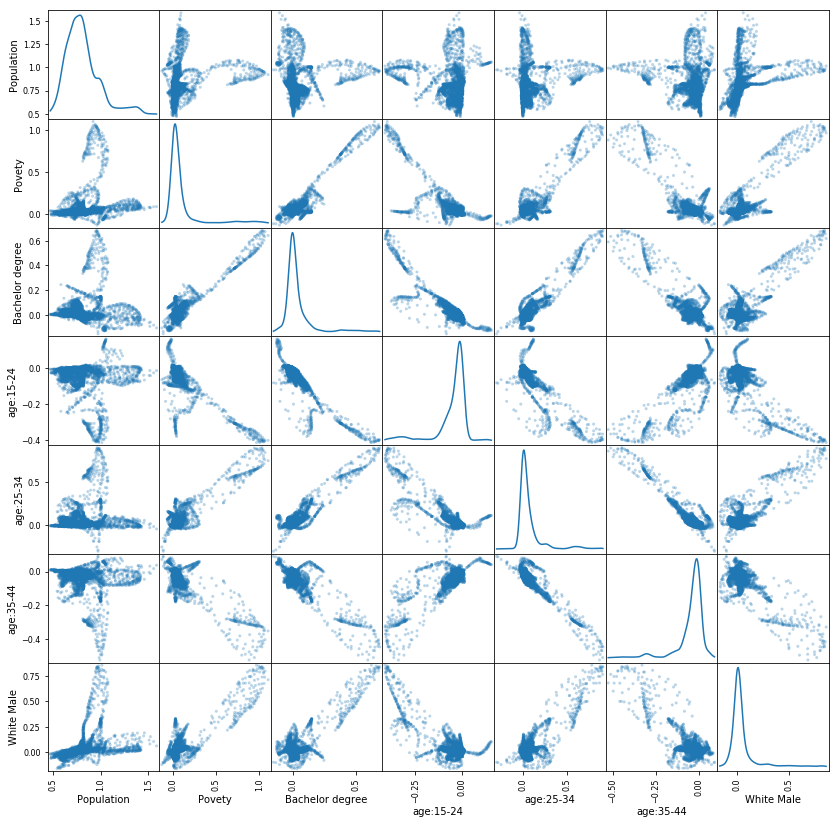

In [373]:
pd.plotting.scatter_matrix(paramsdf, alpha = 0.3, figsize = (14,14), diagonal = 'kde')

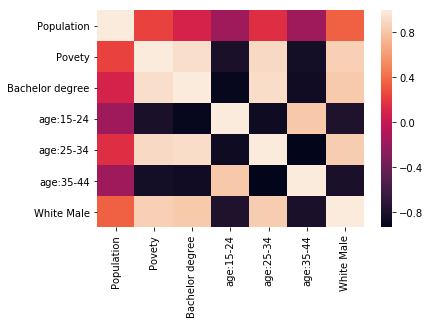

In [374]:
import seaborn as sns
corr = paramsdf.corr()
sns.heatmap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)

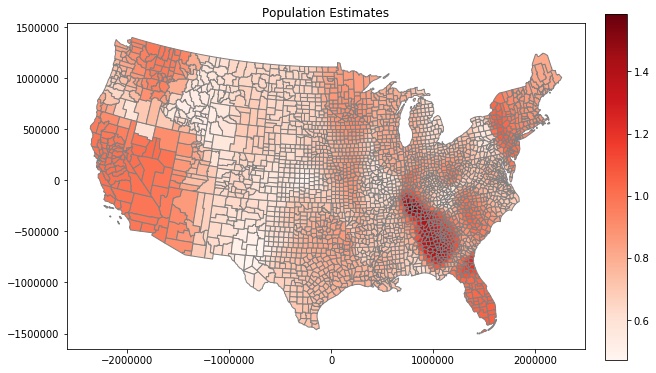

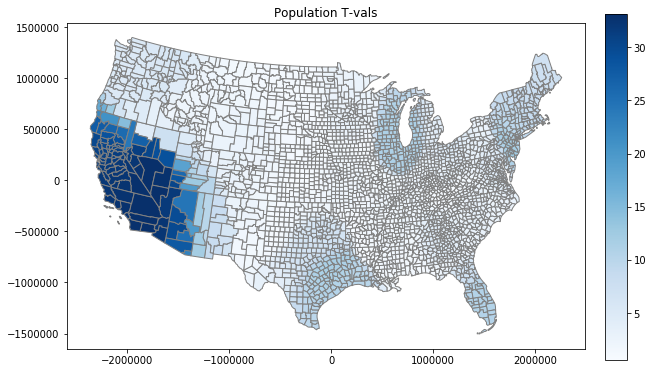

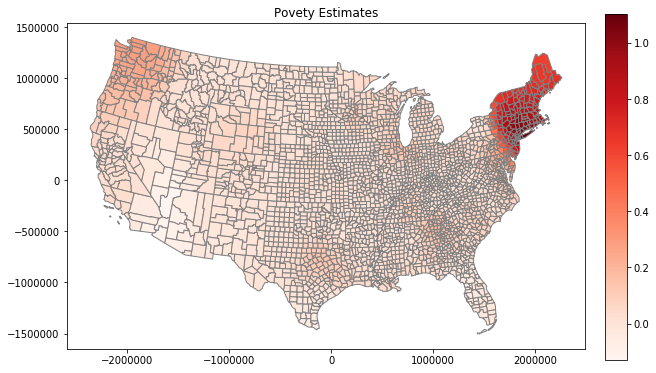

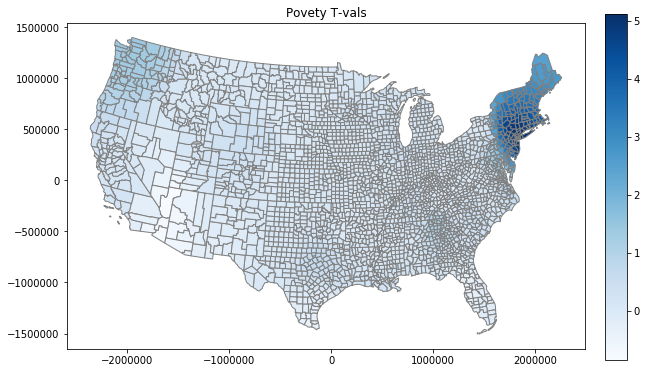

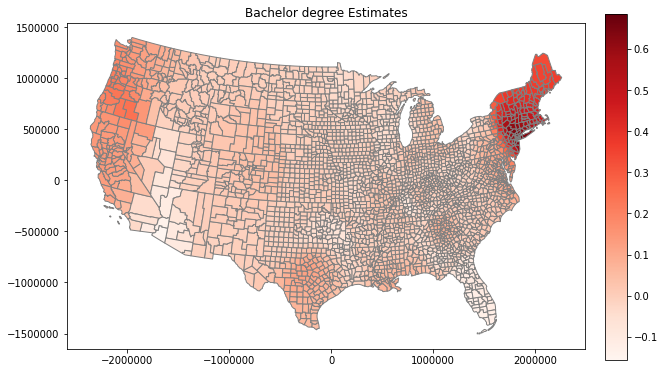

...

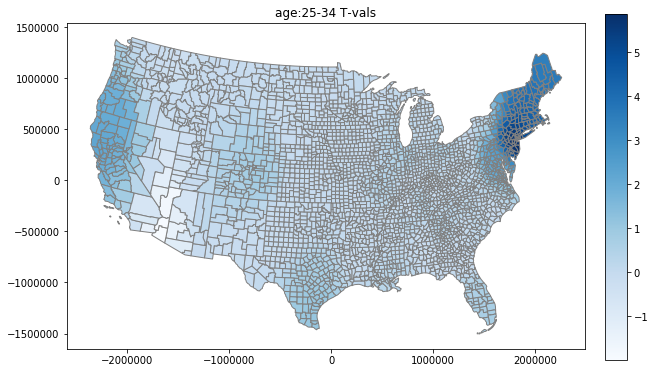

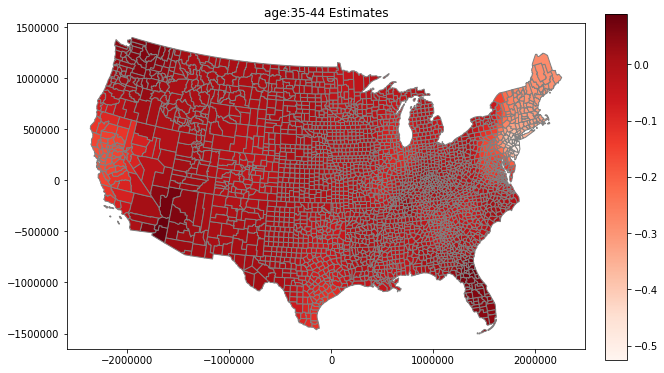

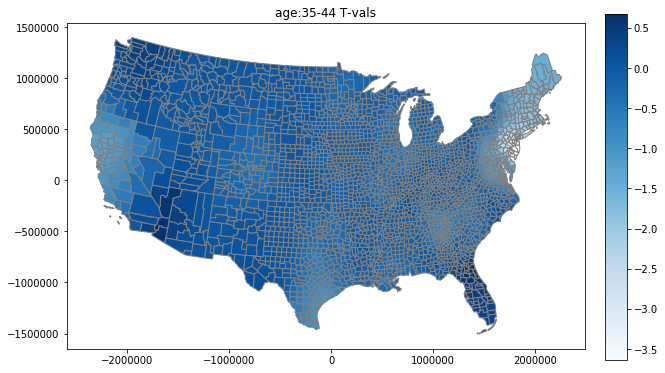

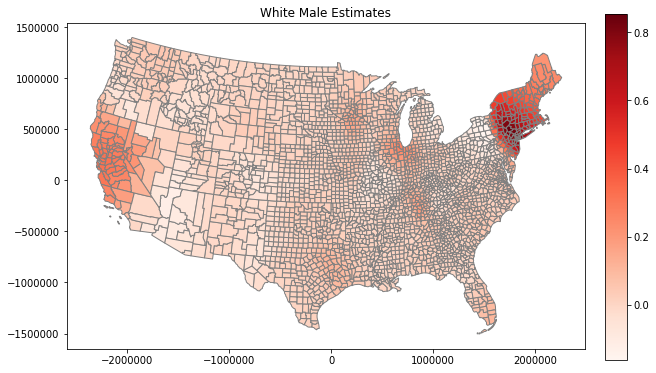

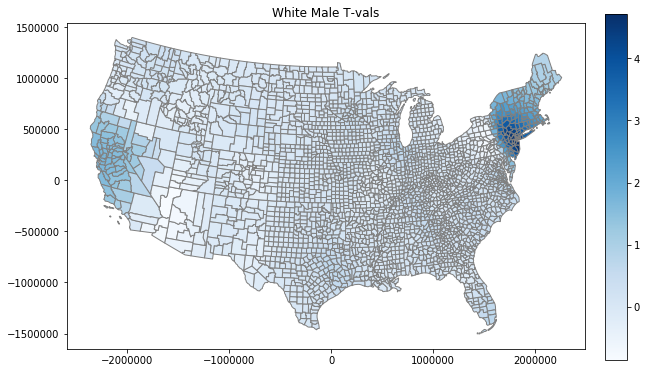

In [377]:
labels = ['Population','Povety','Bachelor degree',
          'age:15-24','age:25-34','age:35-44','White Male']
for param in range(results.params.shape[1]):
    shp2[str(param)] = results.params[:,param]
    vmin, vmax = np.min(shp2[str(param)]), np.max(shp2[str(param)]) 
    ax = shp2.plot(str(param), vmin=vmin, vmax=vmax, figsize=(10,6), cmap='Reds', edgecolor = 'grey')
    ax.set_title(labels[param] + ' Estimates')
    fig = ax.get_figure()
    cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
    sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=vmin, vmax=vmax), cmap='Reds')
    sm._A = []
    fig.colorbar(sm, cax=cax)
    
    shp2[str(param)] = results.tvalues[:,param]
    vmin, vmax = np.min(shp2[str(param)]), np.max(shp2[str(param)]) 
    ax = shp2.plot(str(param), vmin=vmin, vmax=vmax, figsize=(10,6), cmap='Blues', edgecolor = 'grey')
    ax.set_title(labels[param] + ' T-vals')
    fig = ax.get_figure()
    cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
    sm = plt.cm.ScalarMappable(norm=plt.Normalize(vmin=vmin, vmax=vmax), cmap='Blues')
    sm._A = []
    fig.colorbar(sm, cax=cax)